# Canny Edge-Detection guided Disparity Map using SGBM and BM

Loaded: (374, 1238) (374, 1238) (374, 1238)

📊 SGBM Metrics
Original:     MAE=0.998  SD=2.169  RMSE=2.388  SAD=63233.3  SSD=361058.0  Bad3=4.40%  Bad5=1.96%
Edge Overlay: MAE=1.101  SD=3.021  RMSE=3.216  SAD=53401.8  SSD=501763.9  Bad3=5.23%  Bad5=2.48%

📊 BM Metrics
Original:     MAE=0.825  SD=1.672  RMSE=1.864  SAD=40026.7  SSD=168573.4  Bad3=2.23%  Bad5=1.00%
Edge Overlay: MAE=0.842  SD=1.502  RMSE=1.722  SAD=28580.3  SSD=100641.4  Bad3=2.58%  Bad5=1.24%


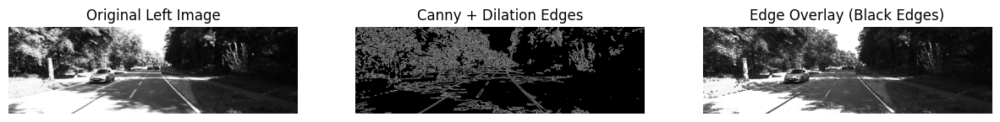

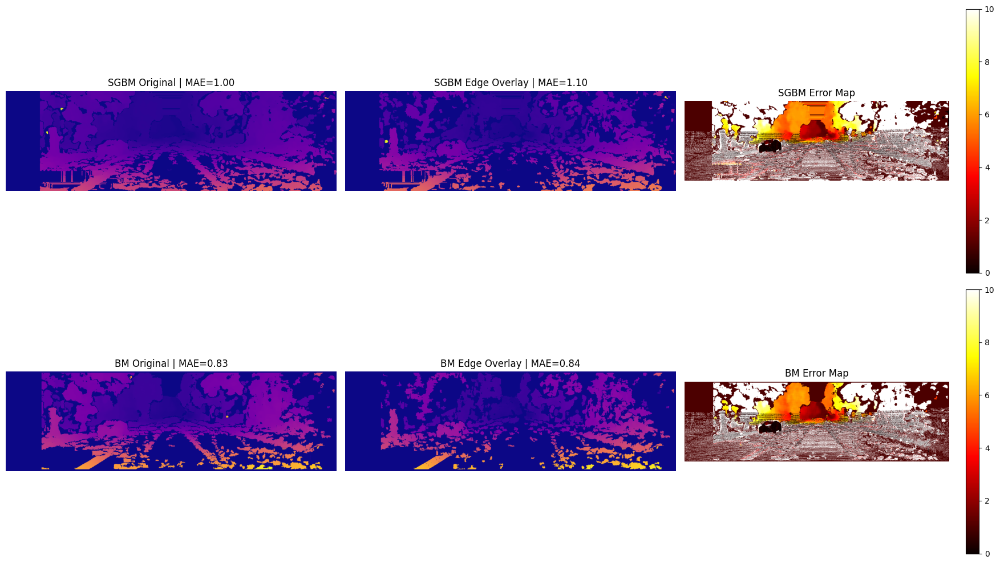

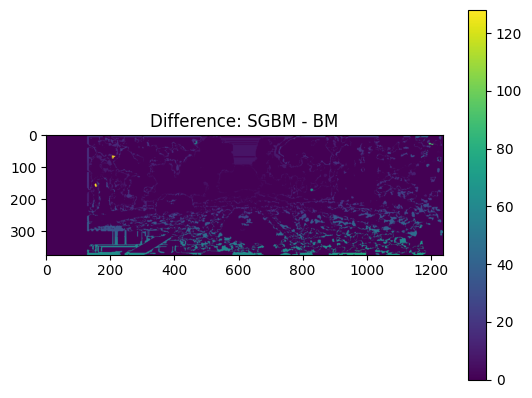

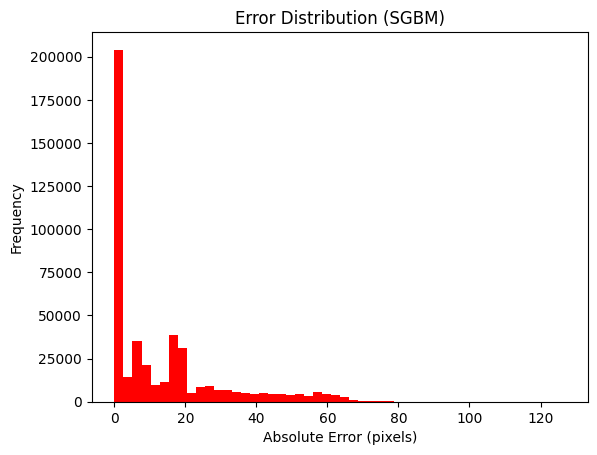

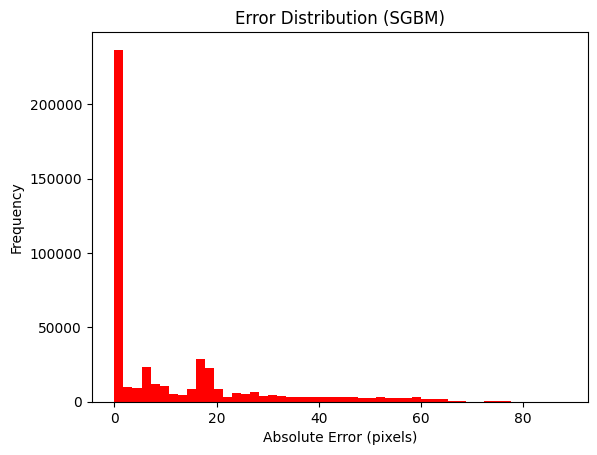

In [186]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# ==========================================================
# 1️⃣ Load KITTI stereo pair and ground truth
# ==========================================================
left_path = "Fast-ACVNet-main/data/KITTI/KITTI_2015/training/image_2/000157_10.png"
right_path = "Fast-ACVNet-main/data/KITTI/KITTI_2015/training/image_3/000157_10.png"
gt_path = "Fast-ACVNet-main/data/KITTI/KITTI_2015/training/disp_occ_0/000157_10.png"

imgL = cv.imread(left_path, cv.IMREAD_GRAYSCALE)
imgR = cv.imread(right_path, cv.IMREAD_GRAYSCALE)
gt_disp = cv.imread(gt_path, cv.IMREAD_UNCHANGED)

if imgL is None or imgR is None or gt_disp is None:
    raise FileNotFoundError("Images or GT not found!")

gt_disp = gt_disp.astype(np.float32) / 256.0  # KITTI disparity is scaled
print("Loaded:", imgL.shape, imgR.shape, gt_disp.shape)


# ==========================================================
# 2️⃣ Edge Overlay with Optional Dilation
# ==========================================================
def overlay_edges(image, low_thresh=50, high_thresh=200, dilate_iter=1):
    edges = cv.Canny(image, low_thresh, high_thresh)

    # make edges thicker
    kernel = np.ones((3,3), np.uint8)
    edges_dil = cv.dilate(edges, kernel, iterations=dilate_iter) * 1

    overlay = image.copy()
    overlay[edges > 0] = 0
    #overlay[edges_dil > 0] = 0  # black out edges

    return overlay, edges


# ==========================================================
# 3️⃣ StereoSGBM version
# ==========================================================
window_size = 15
num_disp_sgbm = 128
min_disp = 0

def compute_disparity_sgbm(imgL, imgR):
    stereo = cv.StereoSGBM_create(
        minDisparity=min_disp,
        numDisparities=num_disp_sgbm,
        blockSize=window_size,
        uniquenessRatio=15,
        speckleWindowSize=50,
        speckleRange=16,
        preFilterCap=31,
        mode=cv.STEREO_SGBM_MODE_SGBM_3WAY
    )
    return stereo.compute(imgL, imgR).astype(np.float32) / 16.0


# ==========================================================
# 4️⃣ StereoBM version
# ==========================================================
block_size = 15
num_disp_bm = 128
def compute_disparity_bm(imgL, imgR):
    stereo = cv.StereoBM_create(
        numDisparities=num_disp_bm,
        blockSize=block_size
    )
    stereo.setPreFilterSize(9)
    stereo.setPreFilterCap(31)
    stereo.setMinDisparity(0)
    stereo.setTextureThreshold(20)
    stereo.setUniquenessRatio(15)
    stereo.setSpeckleWindowSize(50)
    stereo.setSpeckleRange(16)

    return stereo.compute(imgL, imgR).astype(np.float32) / 16.0


# ==========================================================
# 5️⃣ Compute original + edge-overlay disparities
# ==========================================================
# SGBM
disp_sgbm_orig = compute_disparity_sgbm(imgL, imgR)
imgL_edge, edges = overlay_edges(imgL)
imgR_edge, _ = overlay_edges(imgR)
disp_sgbm_edge = compute_disparity_sgbm(imgL_edge, imgR_edge)

# BM
disp_bm_orig = compute_disparity_bm(imgL, imgR)
disp_bm_edge = compute_disparity_bm(imgL_edge, imgR_edge)


# # ==========================================================
# # 6️⃣ Compute disp (optional)
# # ==========================================================
# f, B = 707.0, 0.54

# def disp_to_disp(disp):
#     depth = f * B / (disp + 1e-6)
#     depth[disp <= 0] = np.nan
#     return depth

# depth_sgbm_orig = disp_to_depth(disp_sgbm_orig)
# depth_bm_orig = disp_to_depth(disp_bm_orig)


# ==========================================================
# 7️⃣ Metrics (MAE, SD, RMSE, SAD, SSD, Bad3, Bad5) + Error Maps
# ==========================================================
def compute_metrics(pred, gt):
    mask = (gt > 0) & (pred > 0)
    abs_err = np.abs(pred - gt)
    sq_err = abs_err ** 2

    # Main metrics
    mae = np.mean(abs_err[mask])
    sd = np.std(abs_err[mask])
    rmse = np.sqrt(np.mean(sq_err[mask]))

    # Sum-based metrics
    sad = np.sum(abs_err[mask])
    ssd = np.sum(sq_err[mask])

    # KITTI-style error percentages
    bad3 = np.mean(abs_err[mask] > 3.0) * 100
    bad5 = np.mean(abs_err[mask] > 5.0) * 100

    return mae, sd, rmse, sad, ssd, bad3, bad5, abs_err


# SGBM metrics
sgbm_mae, sgbm_sd, sgbm_rmse, sgbm_sad, sgbm_ssd, sgbm_bad3, sgbm_bad5, sgbm_err = \
    compute_metrics(disp_sgbm_orig, gt_disp)

sgbm_mae_e, sgbm_sd_e, sgbm_rmse_e, sgbm_sad_e, sgbm_ssd_e, sgbm_bad3_e, sgbm_bad5_e, sgbm_err_e = \
    compute_metrics(disp_sgbm_edge, gt_disp)


# BM metrics
bm_mae, bm_sd, bm_rmse, bm_sad, bm_ssd, bm_bad3, bm_bad5, bm_err = \
    compute_metrics(disp_bm_orig, gt_disp)

bm_mae_e, bm_sd_e, bm_rmse_e, bm_sad_e, bm_ssd_e, bm_bad3_e, bm_bad5_e, bm_err_e = \
    compute_metrics(disp_bm_edge, gt_disp)


# ==========================================================
# Printing metrics
# ==========================================================
print("\n📊 SGBM Metrics")
print(f"Original:     MAE={sgbm_mae:.3f}  SD={sgbm_sd:.3f}  RMSE={sgbm_rmse:.3f}  "
      f"SAD={sgbm_sad:.1f}  SSD={sgbm_ssd:.1f}  Bad3={sgbm_bad3:.2f}%  Bad5={sgbm_bad5:.2f}%")

print(f"Edge Overlay: MAE={sgbm_mae_e:.3f}  SD={sgbm_sd_e:.3f}  RMSE={sgbm_rmse_e:.3f}  "
      f"SAD={sgbm_sad_e:.1f}  SSD={sgbm_ssd_e:.1f}  Bad3={sgbm_bad3_e:.2f}%  Bad5={sgbm_bad5_e:.2f}%")

print("\n📊 BM Metrics")
print(f"Original:     MAE={bm_mae:.3f}  SD={bm_sd:.3f}  RMSE={bm_rmse:.3f}  "
      f"SAD={bm_sad:.1f}  SSD={bm_ssd:.1f}  Bad3={bm_bad3:.2f}%  Bad5={bm_bad5:.2f}%")

print(f"Edge Overlay: MAE={bm_mae_e:.3f}  SD={bm_sd_e:.3f}  RMSE={bm_rmse_e:.3f}  "
      f"SAD={bm_sad_e:.1f}  SSD={bm_ssd_e:.1f}  Bad3={bm_bad3_e:.2f}%  Bad5={bm_bad5_e:.2f}%")



# ==========================================================
# 8️⃣ Visualizations
# ==========================================================
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(imgL, cmap='gray')
plt.title("Original Left Image")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(edges, cmap='gray')
plt.title("Canny + Dilation Edges")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(imgL_edge, cmap='gray')
plt.title("Edge Overlay (Black Edges)")
plt.axis('off')

plt.show()


# ----------- Disparity & Error Maps --------------
plt.figure(figsize=(18,10))

plt.subplot(2,3,1)
plt.imshow(disp_sgbm_orig, cmap='plasma')
plt.title(f"SGBM Original | MAE={sgbm_mae:.2f}")
plt.axis('off')

plt.subplot(2,3,2)
plt.imshow(disp_sgbm_edge, cmap='plasma')
plt.title(f"SGBM Edge Overlay | MAE={sgbm_mae_e:.2f}")
plt.axis('off')

plt.subplot(2,3,3)
plt.imshow(sgbm_err, cmap='hot', vmax=10)
plt.title("SGBM Error Map")
plt.axis('off')
plt.colorbar()

plt.subplot(2,3,4)
plt.imshow(disp_bm_orig, cmap='plasma')
plt.title(f"BM Original | MAE={bm_mae:.2f}")
plt.axis('off')

plt.subplot(2,3,5)
plt.imshow(disp_bm_edge, cmap='plasma')
plt.title(f"BM Edge Overlay | MAE={bm_mae_e:.2f}")
plt.axis('off')

plt.subplot(2,3,6)
plt.imshow(bm_err, cmap='hot', vmax=10)
plt.title("BM Error Map")
plt.axis('off')
plt.colorbar()

plt.tight_layout()
plt.show()

diff_map = np.abs(disp_sgbm_orig - disp_bm_orig)
plt.imshow(diff_map, cmap='viridis')
plt.colorbar()
plt.title("Difference: SGBM - BM")
plt.show()

plt.hist(sgbm_err.flatten(), bins=50, color='red')
plt.title("Error Distribution (SGBM)")
plt.xlabel("Absolute Error (pixels)")
plt.ylabel("Frequency")
plt.show()

plt.hist(bm_err.flatten(), bins=50, color='red')
plt.title("Error Distribution (SGBM)")
plt.xlabel("Absolute Error (pixels)")
plt.ylabel("Frequency")
plt.show()


### Report and Slides

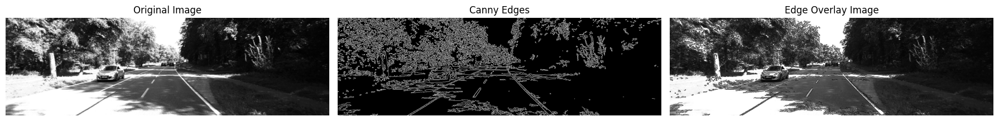

In [187]:
# ==========================================================
# FIGURE 1 — Original | Canny | Edge-Overlay Image
# ==========================================================
plt.figure(figsize=(18,6))

plt.subplot(1,3,1)
plt.imshow(imgL, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(edges, cmap='gray')
plt.title("Canny Edges")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(imgL_edge, cmap='gray')
plt.title("Edge Overlay Image")
plt.axis('off')

plt.tight_layout()
plt.savefig("bm_input_edges.png", dpi=300, bbox_inches='tight')
plt.show()


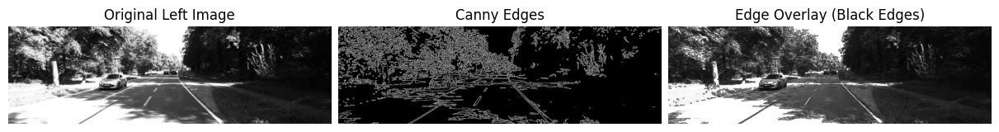

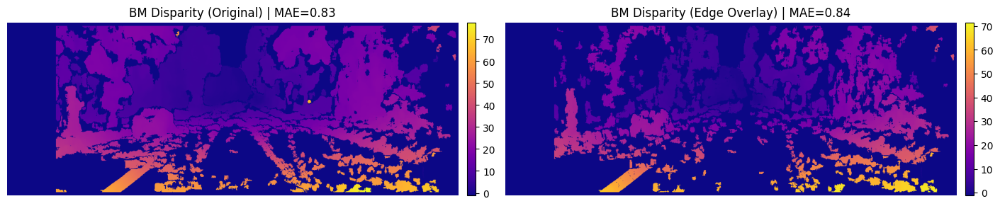

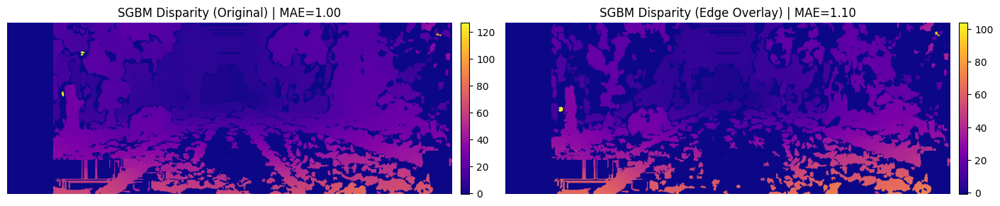

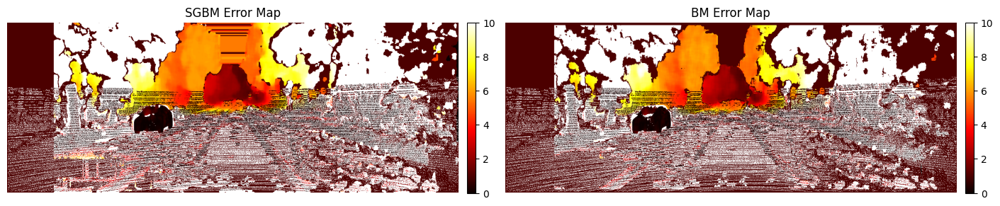

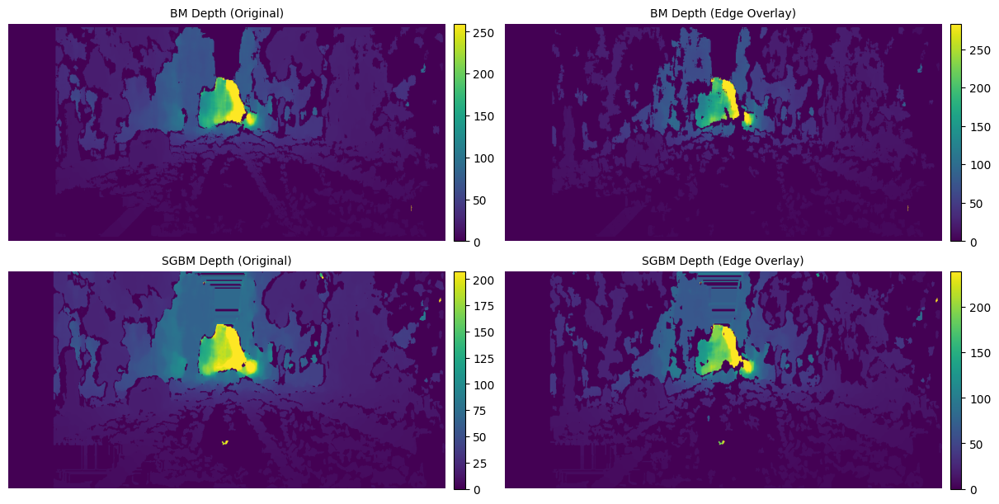

In [188]:
# ==========================================================
#  FIGURE 1: Original Image + Canny + Overlay
# ==========================================================
fig, axes = plt.subplots(1, 3, figsize=(12, 4), constrained_layout=True)

axes[0].imshow(imgL, cmap='gray')
axes[0].set_title("Original Left Image")
axes[0].axis('off')

axes[1].imshow(edges, cmap='gray')
axes[1].set_title("Canny Edges")
axes[1].axis('off')

axes[2].imshow(imgL_edge, cmap='gray')
axes[2].set_title("Edge Overlay (Black Edges)")
axes[2].axis('off')

plt.savefig("ShallowResults1/fig_edges.png", dpi=300, bbox_inches='tight')
plt.show()


# ==========================================================
#  FIGURE 2: BM Disparity Maps (Original vs Canny Overlay)
# ==========================================================
fig, axes = plt.subplots(1, 2, figsize=(14, 2.8), constrained_layout=True)

# Left
im1 = axes[0].imshow(disp_bm_orig, cmap='plasma', aspect='auto')
axes[0].set_title(f"BM Disparity (Original) | MAE={bm_mae:.2f}")
axes[0].axis('off')
fig.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.02)

# Right
im2 = axes[1].imshow(disp_bm_edge, cmap='plasma', aspect='auto')
axes[1].set_title(f"BM Disparity (Edge Overlay) | MAE={bm_mae_e:.2f}")
axes[1].axis('off')
fig.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.02)

plt.savefig("ShallowResults1/fig_bm_disparity.png", dpi=300, bbox_inches='tight')
plt.show()


# ==========================================================
#  FIGURE 3: SGBM Disparity Maps (Original vs Canny Overlay)
# ==========================================================
fig, axes = plt.subplots(1, 2, figsize=(14, 2.8), constrained_layout=True)

im1 = axes[0].imshow(disp_sgbm_orig, cmap='plasma', aspect='auto')
axes[0].set_title(f"SGBM Disparity (Original) | MAE={sgbm_mae:.2f}")
axes[0].axis('off')
fig.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.02)

im2 = axes[1].imshow(disp_sgbm_edge, cmap='plasma', aspect='auto')
axes[1].set_title(f"SGBM Disparity (Edge Overlay) | MAE={sgbm_mae_e:.2f}")
axes[1].axis('off')
fig.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.02)

plt.savefig("ShallowResults1/fig_sgbm_disparity.png", dpi=300, bbox_inches='tight')
plt.show()


# ==========================================================
#  FIGURE 4: Error Maps (SGBM Error | BM Error)
# ==========================================================
fig, axes = plt.subplots(1, 2, figsize=(14, 2.8), constrained_layout=True)

im1 = axes[0].imshow(sgbm_err, cmap='hot', vmax=10, aspect='auto')
axes[0].set_title("SGBM Error Map")
axes[0].axis('off')
fig.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.02)

im2 = axes[1].imshow(bm_err, cmap='hot', vmax=10, aspect='auto')
axes[1].set_title("BM Error Map")
axes[1].axis('off')
fig.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.02)

plt.savefig("ShallowResults1/fig_error_maps.png", dpi=300, bbox_inches='tight')
plt.show()


# ==========================================================
#  FIGURE 5: Depth Maps (BM + SGBM)
# ==========================================================

# Your chosen depth parameters
f = 0.54
B = 721

def disparity_to_depth(disp, f, B):
    depth = np.zeros_like(disp, dtype=np.float32)
    valid = disp > 0
    depth[valid] = (f * B) / disp[valid]

    # Clip depth for meaningful visualization (avoid infinite)
    if np.any(valid):
        depth = np.clip(depth, 0, np.percentile(depth[valid], 99))

    return depth


# Compute depth maps
depth_sgbm_orig = disparity_to_depth(disp_sgbm_orig, f, B)
depth_sgbm_edge = disparity_to_depth(disp_sgbm_edge, f, B)

depth_bm_orig = disparity_to_depth(disp_bm_orig, f, B)
depth_bm_edge = disparity_to_depth(disp_bm_edge, f, B)

# ==========================================================
#  FIGURE: Combined Depth Maps (BM Raw / BM Edge / SGBM Raw / SGBM Edge)
# ==========================================================
fig, axes = plt.subplots(2, 2, figsize=(12, 6), constrained_layout=True)

# ---------- 1. BM Depth (Original) ----------
im1 = axes[0,0].imshow(depth_bm_orig, cmap='viridis', aspect='auto')
axes[0,0].set_title("BM Depth (Original)", fontsize=10)
axes[0,0].axis('off')
fig.colorbar(im1, ax=axes[0,0], fraction=0.046, pad=0.02)

# ---------- 2. BM Depth (Edge Overlay) ----------
im2 = axes[0,1].imshow(depth_bm_edge, cmap='viridis', aspect='auto')
axes[0,1].set_title("BM Depth (Edge Overlay)", fontsize=10)
axes[0,1].axis('off')
fig.colorbar(im2, ax=axes[0,1], fraction=0.046, pad=0.02)

# ---------- 3. SGBM Depth (Original) ----------
im3 = axes[1,0].imshow(depth_sgbm_orig, cmap='viridis', aspect='auto')
axes[1,0].set_title("SGBM Depth (Original)", fontsize=10)
axes[1,0].axis('off')
fig.colorbar(im3, ax=axes[1,0], fraction=0.046, pad=0.02)

# ---------- 4. SGBM Depth (Edge Overlay) ----------
im4 = axes[1,1].imshow(depth_sgbm_edge, cmap='viridis', aspect='auto')
axes[1,1].set_title("SGBM Depth (Edge Overlay)", fontsize=10)
axes[1,1].axis('off')
fig.colorbar(im4, ax=axes[1,1], fraction=0.046, pad=0.02)

# ---------- Save Figure ----------
plt.savefig("ShallowResults1/fig_depth_maps.png", dpi=300, bbox_inches='tight')
plt.show()


# Canny Edge-Detection guided Disparity Map using SGBM and BM with Sobel Matching

Loaded: (374, 1238) (374, 1238) (374, 1238)

========= SGBM Metrics =========
Raw:   MAE=0.998, SD=2.169, RMSE=2.388, SAD=63233.3, SSD=361058.0, Bad3=4.40%, Bad5=1.96%
Canny: MAE=2.802, SD=6.521, RMSE=7.098, SAD=126848.1, SSD=2280563.0, Bad3=21.01%, Bad5=9.17%
Sobel: MAE=0.980, SD=1.807, RMSE=2.055, SAD=35311.6, SSD=152215.1, Bad3=5.17%, Bad5=2.39%

========= BM Metrics =========
Raw:   MAE=0.825, SD=1.672, RMSE=1.864, SAD=40026.7, SSD=168573.4, Bad3=2.23%, Bad5=1.00%
Canny: MAE=3.125, SD=9.900, RMSE=10.381, SAD=64241.7, SSD=2215459.5, Bad3=14.61%, Bad5=7.86%
Sobel: MAE=0.717, SD=1.251, RMSE=1.442, SAD=16672.9, SSD=48348.8, Bad3=2.48%, Bad5=0.98%


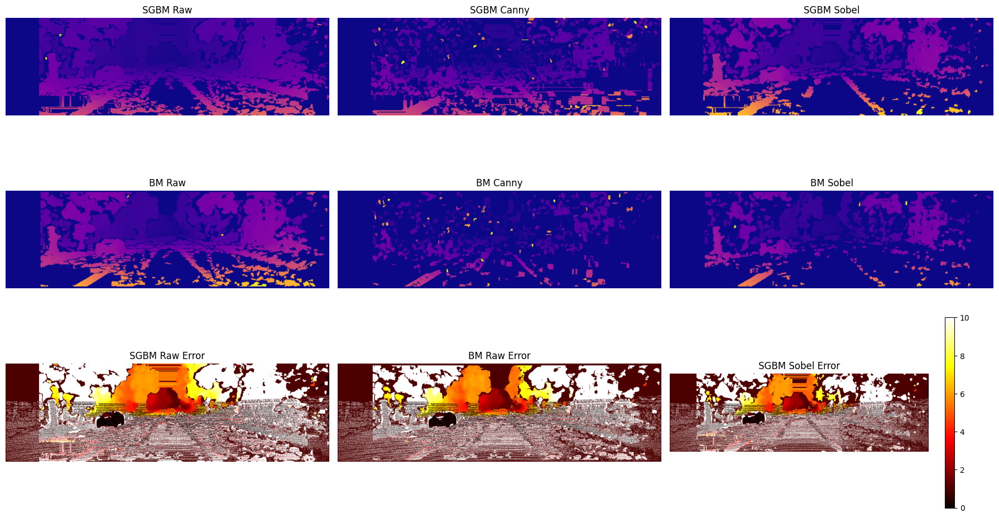

In [190]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# ==========================================================
# 1️⃣ Load KITTI stereo pair and ground truth
# ==========================================================
left_path = "Fast-ACVNet-main/data/KITTI/KITTI_2015/training/image_2/000157_10.png"
right_path = "Fast-ACVNet-main/data/KITTI/KITTI_2015/training/image_3/000157_10.png"
gt_path = "Fast-ACVNet-main/data/KITTI/KITTI_2015/training/disp_occ_0/000157_10.png"

imgL = cv.imread(left_path, cv.IMREAD_GRAYSCALE)
imgR = cv.imread(right_path, cv.IMREAD_GRAYSCALE)
gt_disp = cv.imread(gt_path, cv.IMREAD_UNCHANGED)

if imgL is None or imgR is None or gt_disp is None:
    raise FileNotFoundError("Images or GT not found!")

gt_disp = gt_disp.astype(np.float32) / 256.0
H, W = imgL.shape
print("Loaded:", imgL.shape, imgR.shape, gt_disp.shape)


# ==========================================================
# 2️⃣ Canny Edge Input (NEW)  — REPLACES OLD EDGE OVERLAY
# ==========================================================
def canny_transform(image, low=50, high=150, dilate_iter=1):
    e = cv.Canny(image, low, high)
    kernel = np.ones((3,3), np.uint8)
    e_dil = cv.dilate(e, kernel, iterations=dilate_iter)
    # use the edge map itself as the image signal (not overlay on original)
    return e_dil


cannyL = canny_transform(imgL)
cannyR = canny_transform(imgR)


# ==========================================================
# 3️⃣ Sobel Gradient Transform (unchanged)
# ==========================================================
def sobel_transform(img):
    sobelX = cv.Sobel(img, cv.CV_32F, 1, 0, ksize=3)
    return cv.convertScaleAbs(sobelX)

sobelL = sobel_transform(imgL)
sobelR = sobel_transform(imgR)


# ==========================================================
# 4️⃣ StereoSGBM
# ==========================================================
window_size = 15
num_disp_sgbm = 128
min_disp = 0

def compute_disparity_sgbm(imgL, imgR):
    stereo = cv.StereoSGBM_create(
        minDisparity=min_disp,
        numDisparities=num_disp_sgbm,
        blockSize=window_size,
        uniquenessRatio=15,
        speckleWindowSize=50,
        speckleRange=16,
        preFilterCap=31,
        mode=cv.STEREO_SGBM_MODE_SGBM_3WAY
    )
    return stereo.compute(imgL, imgR).astype(np.float32) / 16.0


# ==========================================================
# 5️⃣ StereoBM
# ==========================================================
block_size = 15
num_disp_bm = 128

def compute_disparity_bm(imgL, imgR):
    stereo = cv.StereoBM_create(
        numDisparities=num_disp_bm,
        blockSize=block_size
    )
    stereo.setPreFilterSize(9)
    stereo.setPreFilterCap(31)
    stereo.setMinDisparity(0)
    stereo.setTextureThreshold(20)
    stereo.setUniquenessRatio(15)
    stereo.setSpeckleWindowSize(50)
    stereo.setSpeckleRange(16)
    return stereo.compute(imgL, imgR).astype(np.float32) / 16.0


# ==========================================================
# 6️⃣ Compute disparities: Raw, Canny, Sobel
# ==========================================================

# SGBM
disp_sgbm_raw   = compute_disparity_sgbm(imgL, imgR)
disp_sgbm_canny = compute_disparity_sgbm(cannyL, cannyR)
disp_sgbm_sobel = compute_disparity_sgbm(sobelL, sobelR)

# BM
disp_bm_raw   = compute_disparity_bm(imgL, imgR)
disp_bm_canny = compute_disparity_bm(cannyL, cannyR)
disp_bm_sobel = compute_disparity_bm(sobelL, sobelR)


# ==========================================================
# 7️⃣ Metrics (MAE, SD, RMSE, SAD, SSD, Bad3, Bad5)
# ==========================================================
def compute_metrics(pred, gt):
    mask = (gt > 0) & (pred > 0)
    abs_err = np.abs(pred - gt)
    sq_err  = abs_err ** 2

    mae  = np.mean(abs_err[mask])
    sd   = np.std(abs_err[mask])
    rmse = np.sqrt(np.mean(sq_err[mask]))

    sad  = np.sum(abs_err[mask])
    ssd  = np.sum(sq_err[mask])

    bad3 = np.mean(abs_err[mask] > 3.0) * 100
    bad5 = np.mean(abs_err[mask] > 5.0) * 100

    return mae, sd, rmse, sad, ssd, bad3, bad5, abs_err


# SGBM metrics
sgbm_raw_m,   sgbm_raw_sd,   sgbm_raw_r,   sgbm_raw_sad,   sgbm_raw_ssd,   sgbm_raw_b3,   sgbm_raw_b5,   sgbm_raw_e   = compute_metrics(disp_sgbm_raw,   gt_disp)
sgbm_canny_m, sgbm_canny_sd, sgbm_canny_r, sgbm_canny_sad, sgbm_canny_ssd, sgbm_canny_b3, sgbm_canny_b5, sgbm_canny_e = compute_metrics(disp_sgbm_canny, gt_disp)
sgbm_sobel_m, sgbm_sobel_sd, sgbm_sobel_r, sgbm_sobel_sad, sgbm_sobel_ssd, sgbm_sobel_b3, sgbm_sobel_b5, sgbm_sobel_e = compute_metrics(disp_sgbm_sobel, gt_disp)

# BM metrics
bm_raw_m,   bm_raw_sd,   bm_raw_r,   bm_raw_sad,   bm_raw_ssd,   bm_raw_b3,   bm_raw_b5,   bm_raw_e   = compute_metrics(disp_bm_raw,   gt_disp)
bm_canny_m, bm_canny_sd, bm_canny_r, bm_canny_sad, bm_canny_ssd, bm_canny_b3, bm_canny_b5, bm_canny_e = compute_metrics(disp_bm_canny, gt_disp)
bm_sobel_m, bm_sobel_sd, bm_sobel_r, bm_sobel_sad, bm_sobel_ssd, bm_sobel_b3, bm_sobel_b5, bm_sobel_e = compute_metrics(disp_bm_sobel, gt_disp)


# ==========================================================
# 8️⃣ Print Metrics Cleanly
# ==========================================================
print("\n========= SGBM Metrics =========")
print(f"Raw:   MAE={sgbm_raw_m:.3f}, SD={sgbm_raw_sd:.3f}, RMSE={sgbm_raw_r:.3f}, SAD={sgbm_raw_sad:.1f}, SSD={sgbm_raw_ssd:.1f}, Bad3={sgbm_raw_b3:.2f}%, Bad5={sgbm_raw_b5:.2f}%")
print(f"Canny: MAE={sgbm_canny_m:.3f}, SD={sgbm_canny_sd:.3f}, RMSE={sgbm_canny_r:.3f}, SAD={sgbm_canny_sad:.1f}, SSD={sgbm_canny_ssd:.1f}, Bad3={sgbm_canny_b3:.2f}%, Bad5={sgbm_canny_b5:.2f}%")
print(f"Sobel: MAE={sgbm_sobel_m:.3f}, SD={sgbm_sobel_sd:.3f}, RMSE={sgbm_sobel_r:.3f}, SAD={sgbm_sobel_sad:.1f}, SSD={sgbm_sobel_ssd:.1f}, Bad3={sgbm_sobel_b3:.2f}%, Bad5={sgbm_sobel_b5:.2f}%")


print("\n========= BM Metrics =========")
print(f"Raw:   MAE={bm_raw_m:.3f}, SD={bm_raw_sd:.3f}, RMSE={bm_raw_r:.3f}, SAD={bm_raw_sad:.1f}, SSD={bm_raw_ssd:.1f}, Bad3={bm_raw_b3:.2f}%, Bad5={bm_raw_b5:.2f}%")
print(f"Canny: MAE={bm_canny_m:.3f}, SD={bm_canny_sd:.3f}, RMSE={bm_canny_r:.3f}, SAD={bm_canny_sad:.1f}, SSD={bm_canny_ssd:.1f}, Bad3={bm_canny_b3:.2f}%, Bad5={bm_canny_b5:.2f}%")
print(f"Sobel: MAE={bm_sobel_m:.3f}, SD={bm_sobel_sd:.3f}, RMSE={bm_sobel_r:.3f}, SAD={bm_sobel_sad:.1f}, SSD={bm_sobel_ssd:.1f}, Bad3={bm_sobel_b3:.2f}%, Bad5={bm_sobel_b5:.2f}%")


# ==========================================================
# 9️⃣ Visualizations
# ==========================================================
plt.figure(figsize=(18,10))

plt.subplot(3,3,1); plt.imshow(disp_sgbm_raw, cmap='plasma');   plt.title("SGBM Raw");   plt.axis('off')
plt.subplot(3,3,2); plt.imshow(disp_sgbm_canny, cmap='plasma'); plt.title("SGBM Canny"); plt.axis('off')
plt.subplot(3,3,3); plt.imshow(disp_sgbm_sobel, cmap='plasma'); plt.title("SGBM Sobel"); plt.axis('off')

plt.subplot(3,3,4); plt.imshow(disp_bm_raw, cmap='plasma');   plt.title("BM Raw");   plt.axis('off')
plt.subplot(3,3,5); plt.imshow(disp_bm_canny, cmap='plasma'); plt.title("BM Canny"); plt.axis('off')
plt.subplot(3,3,6); plt.imshow(disp_bm_sobel, cmap='plasma'); plt.title("BM Sobel"); plt.axis('off')

plt.subplot(3,3,7); plt.imshow(sgbm_raw_e, cmap='hot', vmax=10); plt.title("SGBM Raw Error"); plt.axis('off')
plt.subplot(3,3,8); plt.imshow(bm_raw_e, cmap='hot', vmax=10);   plt.title("BM Raw Error");   plt.axis('off')
plt.subplot(3,3,9); plt.imshow(sgbm_sobel_e, cmap='hot', vmax=10); plt.title("SGBM Sobel Error"); plt.axis('off')

plt.colorbar()
plt.tight_layout()
plt.show()


### Slides and Report

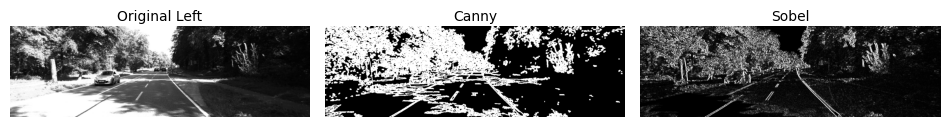

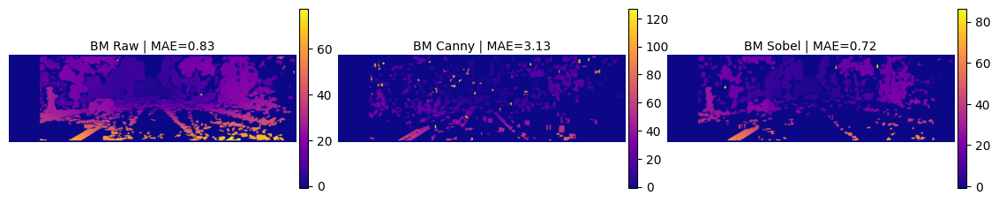

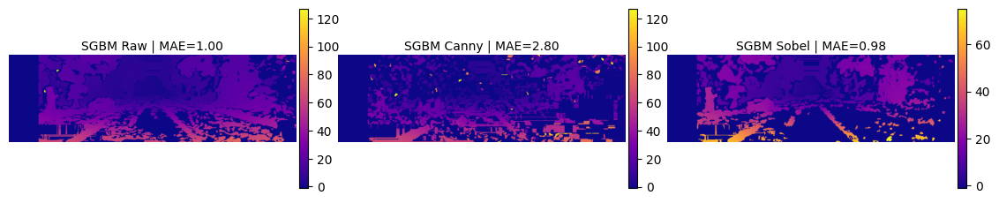

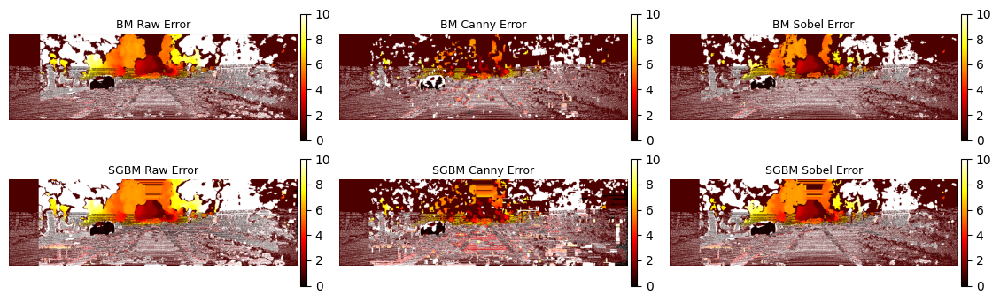

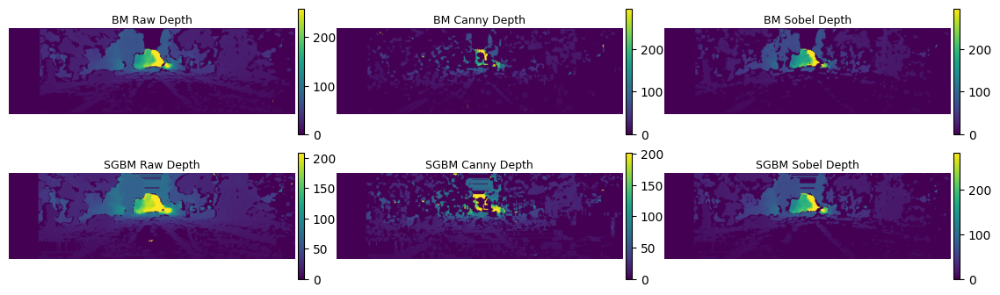

In [191]:
import os
os.makedirs("ShallowResults2", exist_ok=True)

# ==========================================================
# FIGURE 1 — Original, Canny, Sobel Inputs (Very Compact)
# ==========================================================
fig, axes = plt.subplots(1, 3, figsize=(12, 2.8))

for ax in axes:
    ax.axis("off")

axes[0].imshow(imgL, cmap="gray")
axes[0].set_title("Original Left", fontsize=10, pad=4)

axes[1].imshow(cannyL, cmap="gray")
axes[1].set_title("Canny", fontsize=10, pad=4)

axes[2].imshow(sobelL, cmap="gray")
axes[2].set_title("Sobel", fontsize=10, pad=4)

plt.subplots_adjust(wspace=0.05)
plt.savefig("ShallowResults2/fig_inputs.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()


# ==========================================================
# FIGURE 2 — BM Disparity Maps (Raw / Canny / Sobel)
# ==========================================================
fig, axes = plt.subplots(1, 3, figsize=(14, 2.8))

imgs_bm = [disp_bm_raw, disp_bm_canny, disp_bm_sobel]
titles_bm = [f"BM Raw | MAE={bm_raw_m:.2f}", f"BM Canny | MAE={bm_canny_m:.2f}", f"BM Sobel | MAE={bm_sobel_m:.2f}"]

for i, ax in enumerate(axes):
    im = ax.imshow(imgs_bm[i], cmap='plasma')
    ax.set_title(titles_bm[i], fontsize=10, pad=4)
    ax.axis('off')
    fig.colorbar(im, ax=ax, pad=0.01, fraction=0.03)

plt.subplots_adjust(wspace=0.1)
plt.savefig("ShallowResults2/fig_bm_disparities.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()


# ==========================================================
# FIGURE 3 — SGBM Disparity Maps (Raw / Canny / Sobel)
# ==========================================================
fig, axes = plt.subplots(1, 3, figsize=(14, 2.8))

imgs_sgbm = [disp_sgbm_raw, disp_sgbm_canny, disp_sgbm_sobel]
titles_sgbm = [f"SGBM Raw | MAE={sgbm_raw_m:.2f}", f"SGBM Canny | MAE={sgbm_canny_m:.2f}", f"SGBM Sobel | MAE={sgbm_sobel_m:.2f}"]

for i, ax in enumerate(axes):
    im = ax.imshow(imgs_sgbm[i], cmap='plasma')
    ax.set_title(titles_sgbm[i], fontsize=10, pad=4)
    ax.axis('off')
    fig.colorbar(im, ax=ax, pad=0.01, fraction=0.03)

plt.subplots_adjust(wspace=0.1)
plt.savefig("ShallowResults2/fig_sgbm_disparities.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()


# ==========================================================
# FIGURE 4 — Error Maps (BM + SGBM for Raw/Canny/Sobel)
# ==========================================================
fig, axes = plt.subplots(2, 3, figsize=(14, 4))

err_maps = [
    bm_raw_e, bm_canny_e, bm_sobel_e,
    sgbm_raw_e, sgbm_canny_e, sgbm_sobel_e
]

titles_err = [
    "BM Raw Error", "BM Canny Error", "BM Sobel Error",
    "SGBM Raw Error", "SGBM Canny Error", "SGBM Sobel Error"
]

k = 0
for r in range(2):
    for c in range(3):
        im = axes[r, c].imshow(err_maps[k], cmap='hot', vmax=10)
        axes[r, c].set_title(titles_err[k], fontsize=9, pad=4)
        axes[r, c].axis("off")
        fig.colorbar(im, ax=axes[r, c], pad=0.01, fraction=0.03)
        k += 1

plt.subplots_adjust(wspace=0.1, hspace=0.15)
plt.savefig("ShallowResults2/fig_error_maps.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()

# ==========================================================
# DEPTH MAPS — using your chosen parameters
# ==========================================================
f = 0.54      # your input
B = 721       # your input

def disparity_to_depth(disp, f, B):
    depth = np.zeros_like(disp, dtype=np.float32)
    valid = disp > 0
    depth[valid] = (f * B) / disp[valid]

    # clip too-large depth values for visualization
    depth = np.clip(depth, 0, np.percentile(depth[valid], 99))
    return depth


# Compute depth maps for all variants
depth_bm_raw      = disparity_to_depth(disp_bm_raw, f, B)
depth_bm_canny    = disparity_to_depth(disp_bm_canny, f, B)
depth_bm_sobel    = disparity_to_depth(disp_bm_sobel, f, B)

depth_sgbm_raw    = disparity_to_depth(disp_sgbm_raw, f, B)
depth_sgbm_canny  = disparity_to_depth(disp_sgbm_canny, f, B)
depth_sgbm_sobel  = disparity_to_depth(disp_sgbm_sobel, f, B)


# ==========================================================
# FIGURE 5 — Depth Maps (BM + SGBM for Raw/Canny/Sobel)
# ==========================================================
fig, axes = plt.subplots(2, 3, figsize=(14, 4))

depth_maps = [
    depth_bm_raw, depth_bm_canny, depth_bm_sobel,
    depth_sgbm_raw, depth_sgbm_canny, depth_sgbm_sobel
]

titles_depth = [
    "BM Raw Depth", "BM Canny Depth", "BM Sobel Depth",
    "SGBM Raw Depth", "SGBM Canny Depth", "SGBM Sobel Depth"
]

k = 0
for r in range(2):
    for c in range(3):
        im = axes[r, c].imshow(depth_maps[k], cmap='viridis')
        axes[r, c].set_title(titles_depth[k], fontsize=9, pad=4)
        axes[r, c].axis("off")
        fig.colorbar(im, ax=axes[r, c], pad=0.01, fraction=0.03)
        k += 1

plt.subplots_adjust(wspace=0.1, hspace=0.15)
plt.savefig("ShallowResults2/fig_depth_maps.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()


# Disparity Map using SGBM and BM with Census Transform 

Loaded: (374, 1238) (374, 1238) (374, 1238)
Applying Census Transform...

========= SGBM (Raw) Metrics =========
MAE=0.998, SD=2.169, RMSE=2.388, SAD=63233.3, SSD=361058.0, Bad3=4.40%, Bad5=1.96%

========= BM (Raw) Metrics =========
MAE=0.825, SD=1.672, RMSE=1.864, SAD=40026.7, SSD=168573.4, Bad3=2.23%, Bad5=1.00%

========= SGBM (Census) Metrics =========
MAE=0.953, SD=1.714, RMSE=1.961, SAD=52187.4, SSD=210600.7, Bad3=4.29%, Bad5=1.70%

========= BM (Census) Metrics =========
MAE=0.763, SD=1.383, RMSE=1.580, SAD=23543.0, SSD=76992.6, Bad3=2.67%, Bad5=0.97%


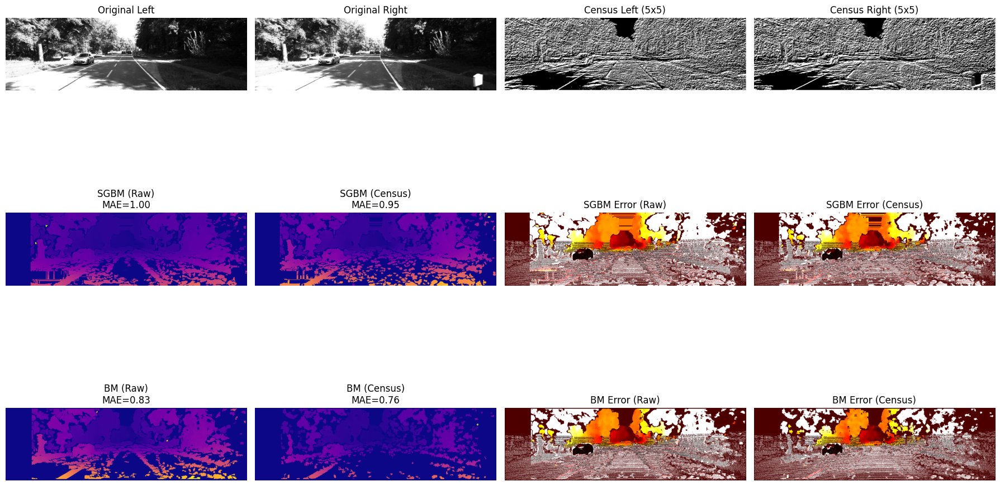

In [193]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# ==========================================================
# 1️⃣ Load KITTI stereo pair and ground truth
# ==========================================================
left_path = "Fast-ACVNet-main/data/KITTI/KITTI_2015/training/image_2/000157_10.png"
right_path = "Fast-ACVNet-main/data/KITTI/KITTI_2015/training/image_3/000157_10.png"
gt_path = "Fast-ACVNet-main/data/KITTI/KITTI_2015/training/disp_occ_0/000157_10.png"

imgL = cv.imread(left_path, cv.IMREAD_GRAYSCALE)
imgR = cv.imread(right_path, cv.IMREAD_GRAYSCALE)
gt_disp = cv.imread(gt_path, cv.IMREAD_UNCHANGED)

if imgL is None or imgR is None or gt_disp is None:
    raise FileNotFoundError("Images or GT not found!")

gt_disp = gt_disp.astype(np.float32) / 256.0
H, W = imgL.shape
print("Loaded:", imgL.shape, imgR.shape, gt_disp.shape)


# ==========================================================
# 2️⃣ Census Transform (5×5 window)
# ==========================================================
def census_transform(img, ksize=5):
    h, w = img.shape
    r = ksize // 2
    census = np.zeros((h, w), dtype=np.uint32)

    for dy in range(-r, r+1):
        for dx in range(-r, r+1):
            if dy == 0 and dx == 0:
                continue
            shifted = np.zeros_like(img)
            shifted[max(0,dy):h-max(0,-dy), max(0,dx):w-max(0,-dx)] = \
                img[max(0,-dy):h-max(0,dy), max(0,-dx):w-max(0,dx)]
            census = (census << 1) | (shifted < img)

    return census


print("Applying Census Transform...")
censusL = census_transform(imgL, ksize=5)
censusR = census_transform(imgR, ksize=5)


# Normalize for stereo algorithms (BM/SGBM require uint8)
censusL_norm = cv.normalize(censusL.astype(np.float32), None, 0, 255, cv.NORM_MINMAX).astype(np.uint8)
censusR_norm = cv.normalize(censusR.astype(np.float32), None, 0, 255, cv.NORM_MINMAX).astype(np.uint8)


# ==========================================================
# 3️⃣ StereoSGBM (Census-based)
# ==========================================================
window_size = 15
num_disp_sgbm = 128
min_disp = 0

def compute_disparity_sgbm(imgL, imgR):
    stereo = cv.StereoSGBM_create(
        minDisparity=min_disp,
        numDisparities=num_disp_sgbm,
        blockSize=window_size,
        uniquenessRatio=15,
        speckleWindowSize=50,
        speckleRange=16,
        preFilterCap=31,
        mode=cv.STEREO_SGBM_MODE_SGBM_3WAY
    )
    return stereo.compute(imgL, imgR).astype(np.float32) / 16.0


# ==========================================================
# 4️⃣ StereoBM (Census-based)
# ==========================================================
block_size = 15
num_disp_bm = 128

def compute_disparity_bm(imgL, imgR):
    stereo = cv.StereoBM_create(
        numDisparities=num_disp_bm,
        blockSize=block_size
    )
    stereo.setPreFilterSize(9)
    stereo.setPreFilterCap(31)
    stereo.setMinDisparity(0)
    stereo.setTextureThreshold(20)
    stereo.setUniquenessRatio(15)
    stereo.setSpeckleWindowSize(50)
    stereo.setSpeckleRange(16)
    return stereo.compute(imgL, imgR).astype(np.float32) / 16.0


# ==========================================================
# 5A️⃣ Compute RAW Disparities (Intensity-based) for comparison
# ==========================================================
disp_sgbm_raw = compute_disparity_sgbm(imgL, imgR)
disp_bm_raw   = compute_disparity_bm(imgL, imgR)

# ==========================================================
# 6A️⃣ RAW Metrics (MAE, SD, RMSE, SAD, SSD, Bad3, Bad5)
# ==========================================================
sgbm_raw_m, sgbm_raw_sd, sgbm_raw_r, sgbm_raw_sad, sgbm_raw_ssd, sgbm_raw_b3, sgbm_raw_b5, sgbm_raw_e = \
    compute_metrics(disp_sgbm_raw, gt_disp)

bm_raw_m, bm_raw_sd, bm_raw_r, bm_raw_sad, bm_raw_ssd, bm_raw_b3, bm_raw_b5, bm_raw_e = \
    compute_metrics(disp_bm_raw, gt_disp)

# PRINT RAW METRICS
print("\n========= SGBM (Raw) Metrics =========")
print(f"MAE={sgbm_raw_m:.3f}, SD={sgbm_raw_sd:.3f}, RMSE={sgbm_raw_r:.3f}, "
      f"SAD={sgbm_raw_sad:.1f}, SSD={sgbm_raw_ssd:.1f}, Bad3={sgbm_raw_b3:.2f}%, Bad5={sgbm_raw_b5:.2f}%")

print("\n========= BM (Raw) Metrics =========")
print(f"MAE={bm_raw_m:.3f}, SD={bm_raw_sd:.3f}, RMSE={bm_raw_r:.3f}, "
      f"SAD={bm_raw_sad:.1f}, SSD={bm_raw_ssd:.1f}, Bad3={bm_raw_b3:.2f}%, Bad5={bm_raw_b5:.2f}%")



# ==========================================================
# 5️⃣ Compute Disparities: SGBM (Census) + BM (Census)
# ==========================================================
disp_sgbm_census = compute_disparity_sgbm(censusL_norm, censusR_norm)
disp_bm_census = compute_disparity_bm(censusL_norm, censusR_norm)


# ==========================================================
# 6️⃣ Metrics (MAE, SD, RMSE, SAD, SSD, Bad3, Bad5)
# ==========================================================
def compute_metrics(pred, gt):
    mask = (gt > 0) & (pred > 0)
    abs_err = np.abs(pred - gt)
    sq_err  = abs_err ** 2

    # Main metrics
    mae  = np.mean(abs_err[mask])
    sd   = np.std(abs_err[mask])
    rmse = np.sqrt(np.mean(sq_err[mask]))

    # Sum-based metrics
    sad = np.sum(abs_err[mask])
    ssd = np.sum(sq_err[mask])

    # KITTI-style thresholds
    bad3 = np.mean(abs_err[mask] > 3.0) * 100
    bad5 = np.mean(abs_err[mask] > 5.0) * 100

    return mae, sd, rmse, sad, ssd, bad3, bad5, abs_err


# Compute metrics
sgbm_m, sgbm_sd, sgbm_r, sgbm_sad, sgbm_ssd, sgbm_b3, sgbm_b5, sgbm_err = \
    compute_metrics(disp_sgbm_census, gt_disp)

bm_m, bm_sd, bm_r, bm_sad, bm_ssd, bm_b3, bm_b5, bm_err = \
    compute_metrics(disp_bm_census, gt_disp)


# ==========================================================
# Print Metrics Cleanly
# ==========================================================
print("\n========= SGBM (Census) Metrics =========")
print(f"MAE={sgbm_m:.3f}, SD={sgbm_sd:.3f}, RMSE={sgbm_r:.3f}, "
      f"SAD={sgbm_sad:.1f}, SSD={sgbm_ssd:.1f}, Bad3={sgbm_b3:.2f}%, Bad5={sgbm_b5:.2f}%")

print("\n========= BM (Census) Metrics =========")
print(f"MAE={bm_m:.3f}, SD={bm_sd:.3f}, RMSE={bm_r:.3f}, "
      f"SAD={bm_sad:.1f}, SSD={bm_ssd:.1f}, Bad3={bm_b3:.2f}%, Bad5={bm_b5:.2f}%")



# ==========================================================
# 7️⃣ Visualizations (Raw vs Census for SGBM and BM)
# ==========================================================
plt.figure(figsize=(18,12))

# ----------------- Row 1: Input Images -----------------
plt.subplot(3,4,1)
plt.imshow(imgL, cmap='gray')
plt.title("Original Left")
plt.axis('off')

plt.subplot(3,4,2)
plt.imshow(imgR, cmap='gray')
plt.title("Original Right")
plt.axis('off')

plt.subplot(3,4,3)
plt.imshow(censusL_norm, cmap='gray')
plt.title("Census Left (5x5)")
plt.axis('off')

plt.subplot(3,4,4)
plt.imshow(censusR_norm, cmap='gray')
plt.title("Census Right (5x5)")
plt.axis('off')


# ----------------- Row 2: SGBM Disparities -----------------
plt.subplot(3,4,5)
plt.imshow(disp_sgbm_raw, cmap='plasma')
plt.title(f"SGBM (Raw)\nMAE={sgbm_raw_m:.2f}")
plt.axis('off')

plt.subplot(3,4,6)
plt.imshow(disp_sgbm_census, cmap='plasma')
plt.title(f"SGBM (Census)\nMAE={sgbm_m:.2f}")
plt.axis('off')

plt.subplot(3,4,7)
plt.imshow(sgbm_raw_e, cmap='hot', vmax=10)
plt.title("SGBM Error (Raw)")
plt.axis('off')

plt.subplot(3,4,8)
plt.imshow(sgbm_err, cmap='hot', vmax=10)
plt.title("SGBM Error (Census)")
plt.axis('off')


# ----------------- Row 3: BM Disparities -----------------
plt.subplot(3,4,9)
plt.imshow(disp_bm_raw, cmap='plasma')
plt.title(f"BM (Raw)\nMAE={bm_raw_m:.2f}")
plt.axis('off')

plt.subplot(3,4,10)
plt.imshow(disp_bm_census, cmap='plasma')
plt.title(f"BM (Census)\nMAE={bm_m:.2f}")
plt.axis('off')

plt.subplot(3,4,11)
plt.imshow(bm_raw_e, cmap='hot', vmax=10)
plt.title("BM Error (Raw)")
plt.axis('off')

plt.subplot(3,4,12)
plt.imshow(bm_err, cmap='hot', vmax=10)
plt.title("BM Error (Census)")
plt.axis('off')

plt.tight_layout()
plt.show()


### Slides and Report

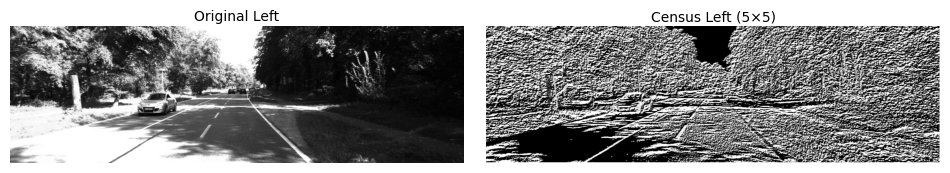

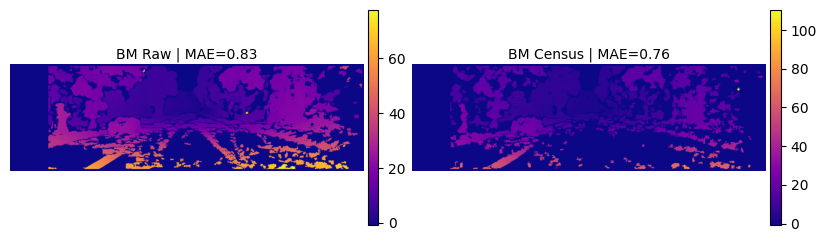

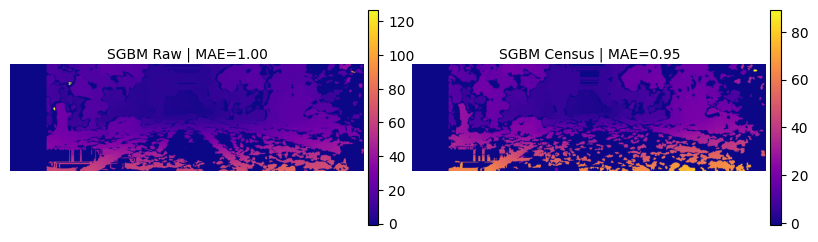

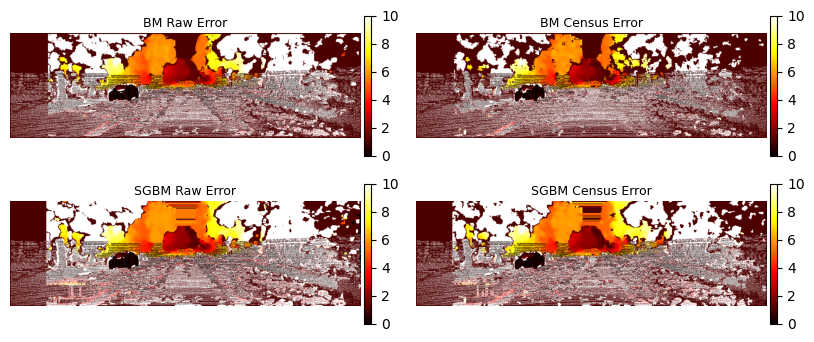

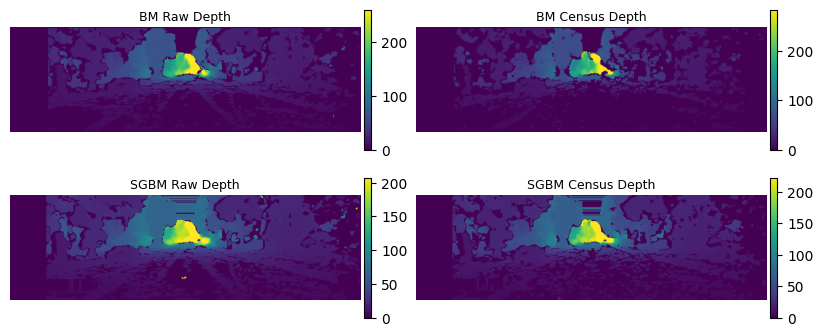

In [194]:
import os
os.makedirs("ShallowResults3", exist_ok=True)

# ==========================================================
# FIGURE 1 — Inputs (Original + Census Left + Census Right)
# ==========================================================
fig, axes = plt.subplots(1, 2, figsize=(12, 2.8))

for ax in axes:
    ax.axis("off")

axes[0].imshow(imgL, cmap="gray")
axes[0].set_title("Original Left", fontsize=10, pad=4)

axes[1].imshow(censusL_norm, cmap="gray")
axes[1].set_title("Census Left (5×5)", fontsize=10, pad=4)

plt.subplots_adjust(wspace=0.05)
plt.savefig("ShallowResults3/fig_inputs.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()


# ==========================================================
# FIGURE 2 — BM Disparities (Raw vs Census)
# ==========================================================
fig, axes = plt.subplots(1, 2, figsize=(10, 2.8))

imgs_bm = [disp_bm_raw, disp_bm_census]
titles_bm = [
    f"BM Raw | MAE={bm_raw_m:.2f}",
    f"BM Census | MAE={bm_m:.2f}"
]

for i, ax in enumerate(axes):
    im = ax.imshow(imgs_bm[i], cmap='plasma')
    ax.set_title(titles_bm[i], fontsize=10, pad=4)
    ax.axis('off')
    fig.colorbar(im, ax=ax, pad=0.01, fraction=0.04)

plt.subplots_adjust(wspace=0.08)
plt.savefig("ShallowResults3/fig_bm_disparities.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()


# ==========================================================
# FIGURE 3 — SGBM Disparities (Raw vs Census)
# ==========================================================
fig, axes = plt.subplots(1, 2, figsize=(10, 2.8))

imgs_sgbm = [disp_sgbm_raw, disp_sgbm_census]
titles_sgbm = [
    f"SGBM Raw | MAE={sgbm_raw_m:.2f}",
    f"SGBM Census | MAE={sgbm_m:.2f}"
]

for i, ax in enumerate(axes):
    im = ax.imshow(imgs_sgbm[i], cmap='plasma')
    ax.set_title(titles_sgbm[i], fontsize=10, pad=4)
    ax.axis('off')
    fig.colorbar(im, ax=ax, pad=0.01, fraction=0.04)

plt.subplots_adjust(wspace=0.08)
plt.savefig("ShallowResults3/fig_sgbm_disparities.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()


# ==========================================================
# FIGURE 4 — Error Maps (BM + SGBM for Raw and Census)
# ==========================================================
fig, axes = plt.subplots(2, 2, figsize=(10, 4))

err_maps = [
    bm_raw_e, bm_err,
    sgbm_raw_e, sgbm_err
]

titles_err = [
    "BM Raw Error",
    "BM Census Error",
    "SGBM Raw Error",
    "SGBM Census Error"
]

k = 0
for r in range(2):
    for c in range(2):
        im = axes[r, c].imshow(err_maps[k], cmap='hot', vmax=10)
        axes[r, c].set_title(titles_err[k], fontsize=9, pad=4)
        axes[r, c].axis("off")
        fig.colorbar(im, ax=axes[r, c], pad=0.01, fraction=0.04)
        k += 1

plt.subplots_adjust(wspace=0.1, hspace=0.2)
plt.savefig("ShallowResults3/fig_error_maps.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()

# ==========================================================
# DEPTH MAP COMPUTATION (f, B PROVIDED BY YOU)
# ==========================================================

f = 0.54      
B = 721      

def disparity_to_depth(disp, f, B):
    """Convert disparity to depth using Z = fB / disp."""
    depth = np.zeros_like(disp, dtype=np.float32)

    valid = disp > 0  # avoid div-by-zero or invalid disparities

    depth[valid] = (f * B) / disp[valid]

    # clip extreme depth values (optional for visualization)
    depth = np.clip(depth, 0, np.percentile(depth[valid], 99))

    return depth


# Compute depth for both BM + SGBM, Raw + Census
depth_bm_raw      = disparity_to_depth(disp_bm_raw,      f, B)
depth_bm_census   = disparity_to_depth(disp_bm_census,   f, B)

depth_sgbm_raw    = disparity_to_depth(disp_sgbm_raw,    f, B)
depth_sgbm_census = disparity_to_depth(disp_sgbm_census, f, B)



# ==========================================================
# FIGURE 5 — DEPTH MAPS (BM + SGBM)
# ==========================================================
fig, axes = plt.subplots(2, 2, figsize=(10, 4))

depth_maps = [
    depth_bm_raw, depth_bm_census,
    depth_sgbm_raw, depth_sgbm_census
]

titles_depth = [
    "BM Raw Depth",
    "BM Census Depth",
    "SGBM Raw Depth",
    "SGBM Census Depth"
]

k = 0
for r in range(2):
    for c in range(2):
        im = axes[r, c].imshow(depth_maps[k], cmap='viridis')
        axes[r, c].set_title(titles_depth[k], fontsize=9, pad=4)
        axes[r, c].axis("off")
        fig.colorbar(im, ax=axes[r, c], pad=0.01, fraction=0.04)
        k += 1

plt.subplots_adjust(wspace=0.1, hspace=0.2)
plt.savefig("ShallowResults3/fig_depth_maps.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()



# Sample Data

In [ ]:
left_path = "SampleData/WIDE_BASELINE_STEREO/CHECKERBOARD/rectified_LEFT_+2.bmp"
right_path = "SampleData/WIDE_BASELINE_STEREO/CHECKERBOARD/rectified_RIGHT_+2.bmp"

left_path = "SampleData/WIDE_BASELINE_STEREO/WHEEL/RECT_INP_LEFT_THETA_1.jpg"
right_path = "SampleData/WIDE_BASELINE_STEREO/WHEEL/RECT_INP_RIGHT_THETA_1.jpg"

left_path = "test_img_L.jpg"
right_path = "test_img_R.jpg"

left_path = "SampleData/bike_left.png"
right_path = "SampleData/bike_right.png"

left_path = "SampleData/resample/ROT_TOP_-2l_left.jpg"
right_path = "SampleData/resample/ROT_BOT_-2l_right.jpg"


left_path = "SampleData/resample/1_left.jpg"
right_path = "SampleData/resample/1_right.jpg"

## Edge Overlay

Loaded: (2592, 2048) (2592, 2048)

==== BM RAW vs EDGE ====
MAE=0.394, SD=1.363, RMSE=1.419, SAD=47898.1, SSD=244866.5

==== SGBM RAW vs EDGE ====
MAE=0.134, SD=1.027, RMSE=1.036, SAD=232536.4, SSD=1869064.4


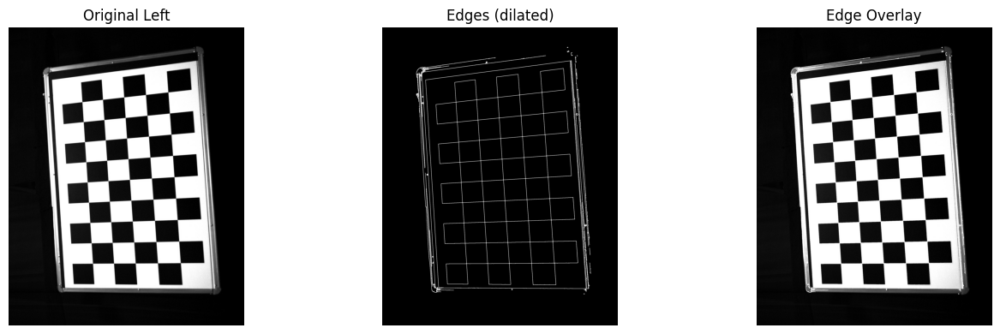

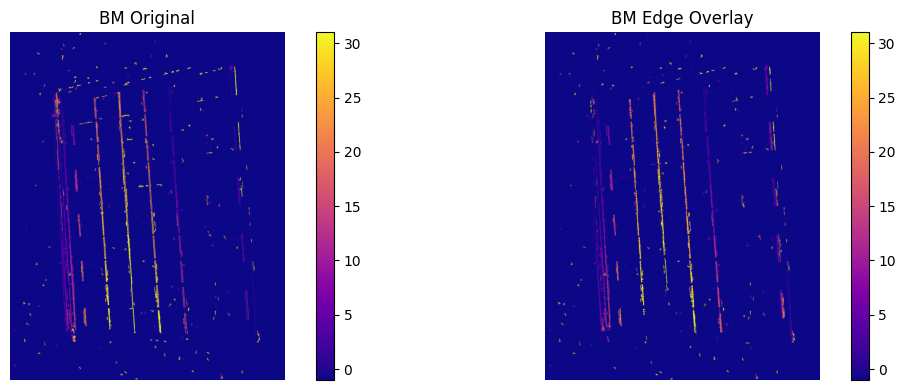

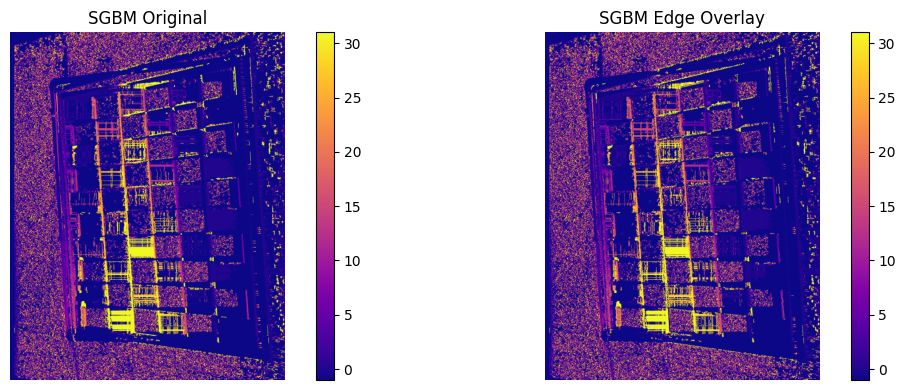

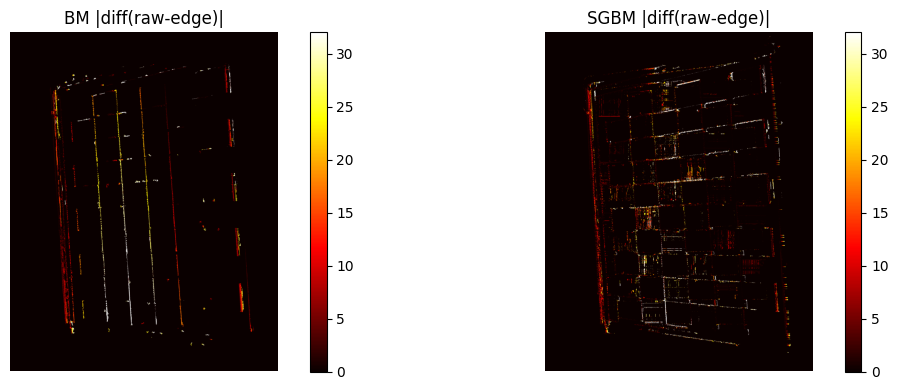

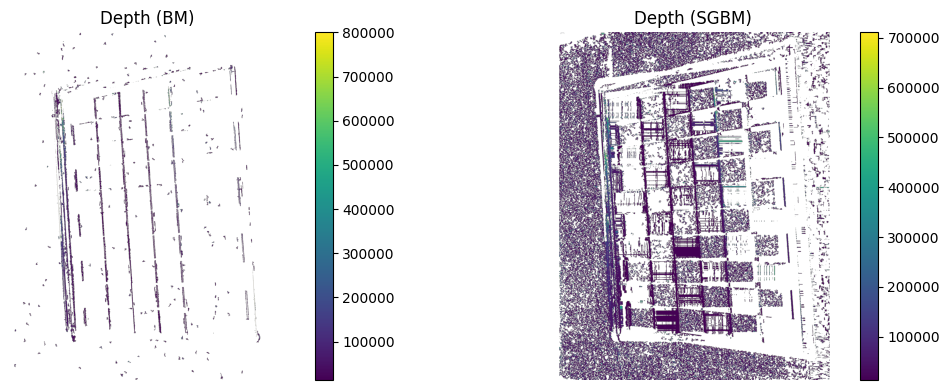

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# ==========================================================
# Load New Stereo Pair (NO GROUND TRUTH)
# ==========================================================
left_path = "SampleData/WIDE_BASELINE_STEREO/WHEEL/RECT_INP_LEFT_THETA_1.jpg"
right_path = "SampleData/WIDE_BASELINE_STEREO/WHEEL/RECT_INP_RIGHT_THETA_1.jpg"


imgL = cv.imread(left_path, cv.IMREAD_GRAYSCALE)
imgR = cv.imread(right_path, cv.IMREAD_GRAYSCALE)

if imgL is None or imgR is None:
    raise FileNotFoundError("Images not found!")

print("Loaded:", imgL.shape, imgR.shape)


# ==========================================================
# Canny Edge + Overlay
# ==========================================================
def overlay_edges(image, low=50, high=150, dilate_iter=1):
    edges = cv.Canny(image, low, high)

    kernel = np.ones((3,3), np.uint8)
    edges_dil = cv.dilate(edges, kernel, iterations=dilate_iter)

    overlay = image.copy()
    overlay[edges_dil > 0] = 255
    return overlay, edges_dil

imgL_overlay, edgesL = overlay_edges(imgL)
imgR_overlay, edgesR = overlay_edges(imgR)


# ==========================================================
# Stereo SGBM
# ==========================================================
def compute_sgbm(L, R):
    stereo = cv.StereoSGBM_create(
        minDisparity=0,
        numDisparities=32,
        blockSize=5,
        uniquenessRatio=10,
        speckleWindowSize=100,
        speckleRange=16,
        preFilterCap=31,
        mode=cv.STEREO_SGBM_MODE_SGBM_3WAY
    )
    return stereo.compute(L, R).astype(np.float32) / 16.0


# ==========================================================
# Stereo BM
# ==========================================================
def compute_bm(L, R):
    stereo = cv.StereoBM_create(numDisparities=32, blockSize=5)
    stereo.setPreFilterSize(9)
    stereo.setPreFilterCap(31)
    stereo.setMinDisparity(0)
    stereo.setTextureThreshold(20)
    stereo.setUniquenessRatio(10)
    stereo.setSpeckleWindowSize(100)
    stereo.setSpeckleRange(16)
    return stereo.compute(L, R).astype(np.float32) / 16.0


# ==========================================================
# Compute Disparities (only maps, no GT)
# ==========================================================
disp_sgbm_orig = compute_sgbm(imgL, imgR)
disp_sgbm_edge = compute_sgbm(imgL_overlay, imgR_overlay)

disp_bm_orig = compute_bm(imgL, imgR)
disp_bm_edge = compute_bm(imgL_overlay, imgR_overlay)


# ==========================================================
# Error metric between raw and overlay disparity
# ==========================================================
def compute_internal_metrics(d1, d2):
    mask = (d1 > 0) & (d2 > 0)
    abs_err = np.abs(d1 - d2)
    sq_err  = abs_err ** 2

    mae  = np.mean(abs_err[mask])
    sd   = np.std(abs_err[mask])
    rmse = np.sqrt(np.mean(sq_err[mask]))
    sad  = np.sum(abs_err[mask])
    ssd  = np.sum(sq_err[mask])

    return mae, sd, rmse, sad, ssd, abs_err


bm_mae, bm_sd, bm_rmse, bm_sad, bm_ssd, bm_diffmap = compute_internal_metrics(disp_bm_orig, disp_bm_edge)
sgbm_mae, sgbm_sd, sgbm_rmse, sgbm_sad, sgbm_ssd, sgbm_diffmap = compute_internal_metrics(disp_sgbm_orig, disp_sgbm_edge)

print("\n==== BM RAW vs EDGE ====")
print(f"MAE={bm_mae:.3f}, SD={bm_sd:.3f}, RMSE={bm_rmse:.3f}, SAD={bm_sad:.1f}, SSD={bm_ssd:.1f}")

print("\n==== SGBM RAW vs EDGE ====")
print(f"MAE={sgbm_mae:.3f}, SD={sgbm_sd:.3f}, RMSE={sgbm_rmse:.3f}, SAD={sgbm_sad:.1f}, SSD={sgbm_ssd:.1f}")


# ==========================================================
# Depth Map Computation
# ==========================================================
f = 2000
B = 200

def disparity_to_depth(disp):
    depth = np.zeros_like(disp)
    valid = disp > 0
    depth[valid] = (f * B) / disp[valid]
    depth[~valid] = np.nan
    return depth

depth_sgbm = disparity_to_depth(disp_sgbm_orig)
depth_bm   = disparity_to_depth(disp_bm_orig)


# ==========================================================
# Visualization
# ==========================================================

# ---- INPUTS ----
plt.figure(figsize=(14,4))
plt.subplot(1,3,1); plt.imshow(imgL, cmap='gray'); plt.title("Original Left"); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(edgesL, cmap='gray'); plt.title("Edges (dilated)"); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(imgL_overlay, cmap='gray'); plt.title("Edge Overlay"); plt.axis('off')
plt.tight_layout(); plt.show()

# ---- BM ----
fig, axes = plt.subplots(1,2, figsize=(12,4))
im1 = axes[0].imshow(disp_bm_orig, cmap='plasma'); axes[0].set_title("BM Original"); axes[0].axis('off')
fig.colorbar(im1, ax=axes[0])
im2 = axes[1].imshow(disp_bm_edge, cmap='plasma'); axes[1].set_title("BM Edge Overlay"); axes[1].axis('off')
fig.colorbar(im2, ax=axes[1])
plt.tight_layout(); plt.show()

# ---- SGBM ----
fig, axes = plt.subplots(1,2, figsize=(12,4))
im1 = axes[0].imshow(disp_sgbm_orig, cmap='plasma'); axes[0].set_title("SGBM Original"); axes[0].axis('off')
fig.colorbar(im1, ax=axes[0])
im2 = axes[1].imshow(disp_sgbm_edge, cmap='plasma'); axes[1].set_title("SGBM Edge Overlay"); axes[1].axis('off')
fig.colorbar(im2, ax=axes[1])
plt.tight_layout(); plt.show()

# ---- RAW vs EDGE ERROR MAP ----
fig, axes = plt.subplots(1,2, figsize=(12,4))
im1 = axes[0].imshow(bm_diffmap, cmap='hot'); axes[0].set_title("BM |diff(raw-edge)|"); axes[0].axis('off')
fig.colorbar(im1, ax=axes[0])
im2 = axes[1].imshow(sgbm_diffmap, cmap='hot'); axes[1].set_title("SGBM |diff(raw-edge)|"); axes[1].axis('off')
fig.colorbar(im2, ax=axes[1])
plt.tight_layout(); plt.show()

# ---- DEPTH MAPS ----
fig, axes = plt.subplots(1,2, figsize=(12,4))
im1 = axes[0].imshow(depth_bm, cmap='viridis'); axes[0].set_title("Depth (BM)"); axes[0].axis('off')
fig.colorbar(im1, ax=axes[0])
im2 = axes[1].imshow(depth_sgbm, cmap='viridis'); axes[1].set_title("Depth (SGBM)"); axes[1].axis('off')
fig.colorbar(im2, ax=axes[1])
plt.tight_layout(); plt.show()


## Intensity Gradient

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]] [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Loaded: (2592, 2048) (2592, 2048)

=========== BM RAW vs CANNY ===========
MAE=0.201  SD=0.224  RMSE=0.301

=========== BM RAW vs SOBEL ===========
MAE=0.631  SD=1.679  RMSE=1.794

=========== SGBM RAW vs CANNY ===========
MAE=11.912  SD=25.327  RMSE=27.988

=========== SGBM RAW vs SOBEL ===========
MAE=5.716  SD=20.179  RMSE=20.973


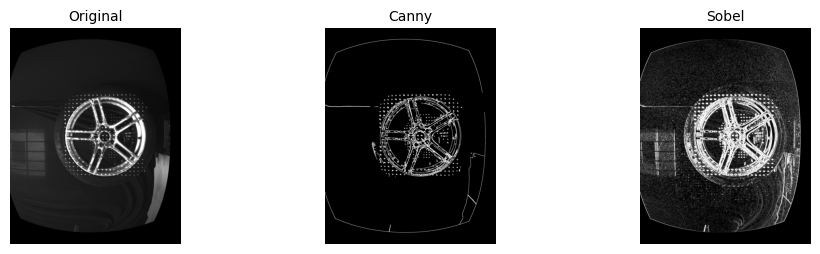

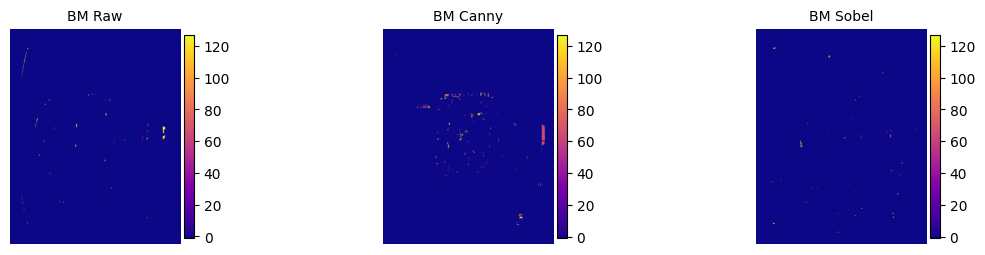

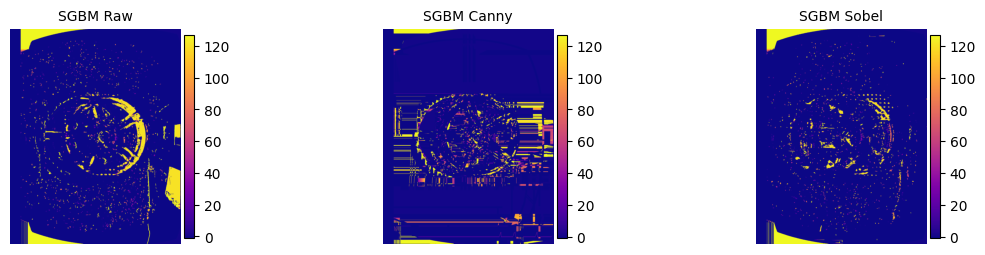

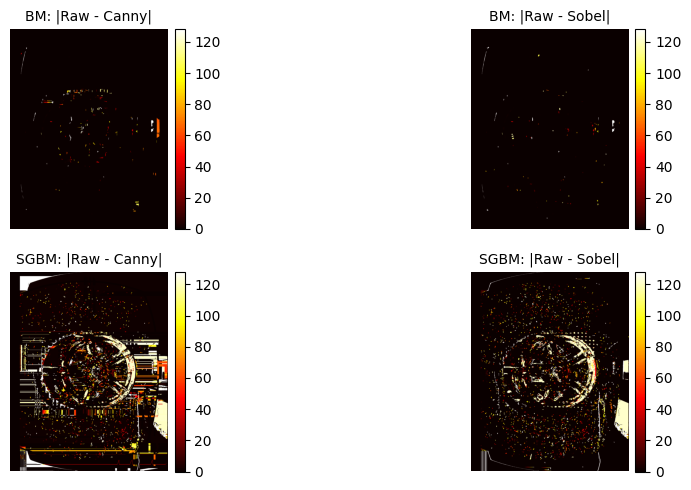

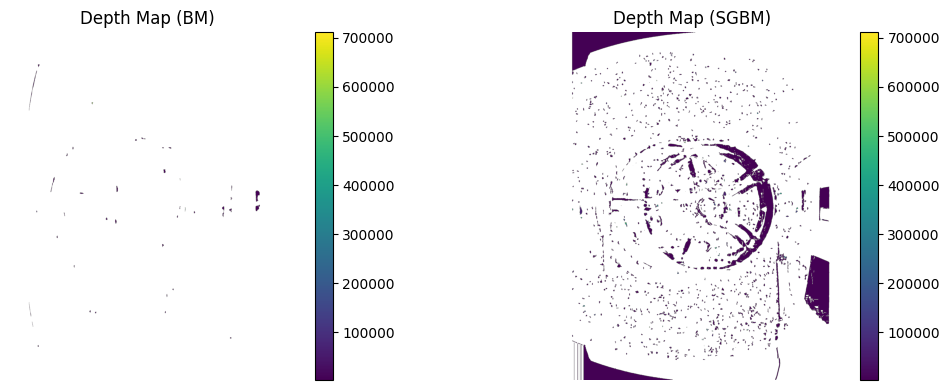

In [209]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

# ==========================================================
# Load stereo pair (NO GROUND TRUTH)
# ==========================================================
left_path = "SampleData/WIDE_BASELINE_STEREO/WHEEL/RECT_INP_LEFT_THETA_1.jpg"
right_path = "SampleData/WIDE_BASELINE_STEREO/WHEEL/RECT_INP_RIGHT_THETA_1.jpg"

left_path = "SampleData/bike_left.png"
right_path = "SampleData/bike_right.png"

left_path = "SampleData/resample/ROT_TOP_2l_left.png"
right_path = "SampleData/resample/ROT_BOT_2l_right.png"

# left_path = "test_img1_L.jpg"
# right_path = "test_img1_R.jpg"


imgL = cv.imread(left_path, cv.IMREAD_GRAYSCALE)
imgR = cv.imread(right_path, cv.IMREAD_GRAYSCALE)

print(imgL,imgR)
if imgL is None or imgR is None:
    raise FileNotFoundError("Images not found!")

print("Loaded:", imgL.shape, imgR.shape)

os.makedirs("ShallowResultsX", exist_ok=True)


# ==========================================================
# Canny + Sobel transforms
# ==========================================================
def canny_transform(image, low=50, high=150, dilate_iter=1):
    e = cv.Canny(image, low, high)
    kernel = np.ones((3,3), np.uint8)
    e_dil = cv.dilate(e, kernel, iterations=dilate_iter)
    return e_dil

def sobel_transform(img):
    sobelX = cv.Sobel(img, cv.CV_32F, 1, 0, ksize=5)
    return cv.convertScaleAbs(sobelX)

cannyL = canny_transform(imgL)
cannyR = canny_transform(imgR)
sobelL = sobel_transform(imgL)
sobelR = sobel_transform(imgR)


# ==========================================================
# Stereo algorithms
# ==========================================================
def compute_sgbm(L, R):
    stereo = cv.StereoSGBM_create(
        minDisparity=0,
        numDisparities=128,
        blockSize=17,
        uniquenessRatio=15,
        speckleWindowSize=50,
        speckleRange=16,
        preFilterCap=31,
        mode=cv.STEREO_SGBM_MODE_SGBM_3WAY
    )
    return stereo.compute(L, R).astype(np.float32) / 16.0

def compute_bm(L, R):
    stereo = cv.StereoBM_create(numDisparities=128, blockSize=31)
    stereo.setPreFilterSize(9)
    stereo.setPreFilterCap(25)
    stereo.setMinDisparity(0)
    stereo.setTextureThreshold(20)
    stereo.setUniquenessRatio(15)
    stereo.setSpeckleWindowSize(50)
    stereo.setSpeckleRange(16)
    return stereo.compute(L, R).astype(np.float32) / 16.0


# ==========================================================
# Disparities: Raw / Canny / Sobel
# ==========================================================
disp_sgbm_raw   = compute_sgbm(imgL, imgR)
disp_sgbm_canny = compute_sgbm(cannyL, cannyR)
disp_sgbm_sobel = compute_sgbm(sobelL, sobelR)

disp_bm_raw     = compute_bm(imgL, imgR)
disp_bm_canny   = compute_bm(cannyL, cannyR)
disp_bm_sobel   = compute_bm(sobelL, sobelR)


# ==========================================================
# Error metrics between disparity maps (NO GT)
# ==========================================================
def compute_internal_metrics(d1, d2):
    mask = (d1 > 0) & (d2 > 0)
    abs_err = np.abs(d1 - d2)
    sq_err  = abs_err ** 2

    mae  = np.mean(abs_err[mask])
    sd   = np.std(abs_err[mask])
    rmse = np.sqrt(np.mean(sq_err[mask]))
    sad  = np.sum(abs_err[mask])
    ssd  = np.sum(sq_err[mask])

    return mae, sd, rmse, sad, ssd, abs_err

# BM errors
bm_raw_canny_m, bm_raw_canny_sd, bm_raw_canny_rmse, _, _, bm_err_canny = compute_internal_metrics(disp_bm_raw, disp_bm_canny)
bm_raw_sobel_m, bm_raw_sobel_sd, bm_raw_sobel_rmse, _, _, bm_err_sobel = compute_internal_metrics(disp_bm_raw, disp_bm_sobel)

# SGBM errors
sgbm_raw_canny_m, sgbm_raw_canny_sd, sgbm_raw_canny_rmse, _, _, sgbm_err_canny = compute_internal_metrics(disp_sgbm_raw, disp_sgbm_canny)
sgbm_raw_sobel_m, sgbm_raw_sobel_sd, sgbm_raw_sobel_rmse, _, _, sgbm_err_sobel = compute_internal_metrics(disp_sgbm_raw, disp_sgbm_sobel)


print("\n=========== BM RAW vs CANNY ===========")
print(f"MAE={bm_raw_canny_m:.3f}  SD={bm_raw_canny_sd:.3f}  RMSE={bm_raw_canny_rmse:.3f}")

print("\n=========== BM RAW vs SOBEL ===========")
print(f"MAE={bm_raw_sobel_m:.3f}  SD={bm_raw_sobel_sd:.3f}  RMSE={bm_raw_sobel_rmse:.3f}")

print("\n=========== SGBM RAW vs CANNY ===========")
print(f"MAE={sgbm_raw_canny_m:.3f}  SD={sgbm_raw_canny_sd:.3f}  RMSE={sgbm_raw_canny_rmse:.3f}")

print("\n=========== SGBM RAW vs SOBEL ===========")
print(f"MAE={sgbm_raw_sobel_m:.3f}  SD={sgbm_raw_sobel_sd:.3f}  RMSE={sgbm_raw_sobel_rmse:.3f}")


# ==========================================================
# Depth maps
# ==========================================================
f = 2000
B = 200

def disparity_to_depth(disp):
    depth = np.zeros_like(disp)
    valid = disp > 0
    depth[valid] = (f * B) / disp[valid]
    depth[~valid] = np.nan
    return depth

depth_sgbm = disparity_to_depth(disp_sgbm_raw)
depth_bm   = disparity_to_depth(disp_bm_raw)


# ==========================================================
# PLOTTING (compact for LaTeX)
# ==========================================================

# ---------- FIGURE 1: INPUTS ----------
fig, axes = plt.subplots(1, 3, figsize=(12, 2.8))
for ax in axes: ax.axis("off")

axes[0].imshow(imgL, cmap="gray"); axes[0].set_title("Original", fontsize=10)
axes[1].imshow(cannyL, cmap="gray"); axes[1].set_title("Canny", fontsize=10)
axes[2].imshow(sobelL, cmap="gray"); axes[2].set_title("Sobel", fontsize=10)

plt.subplots_adjust(wspace=0.05)
plt.savefig("ShallowResultsX/fig_inputs.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()


# ---------- FIGURE 2: BM DISPARITY ----------
fig, axes = plt.subplots(1, 3, figsize=(14, 2.8))
bm_maps = [disp_bm_raw, disp_bm_canny, disp_bm_sobel]
bm_titles = ["BM Raw", "BM Canny", "BM Sobel"]

for i, ax in enumerate(axes):
    im = ax.imshow(bm_maps[i], cmap='plasma')
    ax.set_title(bm_titles[i], fontsize=10)
    ax.axis('off')
    fig.colorbar(im, ax=ax, pad=0.01, fraction=0.03)

plt.subplots_adjust(wspace=0.1)
plt.savefig("ShallowResultsX/fig_bm_disparities.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()


# ---------- FIGURE 3: SGBM DISPARITY ----------
fig, axes = plt.subplots(1, 3, figsize=(14, 2.8))
sgbm_maps = [disp_sgbm_raw, disp_sgbm_canny, disp_sgbm_sobel]
sgbm_titles = ["SGBM Raw", "SGBM Canny", "SGBM Sobel"]

for i, ax in enumerate(axes):
    im = ax.imshow(sgbm_maps[i], cmap='plasma')
    ax.set_title(sgbm_titles[i], fontsize=10)
    ax.axis('off')
    fig.colorbar(im, ax=ax, pad=0.01, fraction=0.03)

plt.subplots_adjust(wspace=0.1)
plt.savefig("ShallowResultsX/fig_sgbm_disparities.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()


# ---------- FIGURE 4: ERROR MAPS ----------
fig, axes = plt.subplots(2, 2, figsize=(12, 5))

err_maps = [
    bm_err_canny, bm_err_sobel,
    sgbm_err_canny, sgbm_err_sobel
]
titles = [
    "BM: |Raw - Canny|",
    "BM: |Raw - Sobel|",
    "SGBM: |Raw - Canny|",
    "SGBM: |Raw - Sobel|"
]

k = 0
for r in range(2):
    for c in range(2):
        im = axes[r, c].imshow(err_maps[k], cmap='hot')
        axes[r, c].set_title(titles[k], fontsize=10)
        axes[r, c].axis("off")
        fig.colorbar(im, ax=axes[r, c], pad=0.01, fraction=0.04)
        k += 1

plt.tight_layout()
plt.savefig("ShallowResultsX/fig_error_maps.png", dpi=300, bbox_inches='tight')
plt.show()


# ---------- FIGURE 5: DEPTH MAPS ----------
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

im1 = axes[0].imshow(depth_bm, cmap='viridis')
axes[0].set_title("Depth Map (BM)")
axes[0].axis('off')
fig.colorbar(im1, ax=axes[0])

im2 = axes[1].imshow(depth_sgbm, cmap='viridis')
axes[1].set_title("Depth Map (SGBM)")
axes[1].axis('off')
fig.colorbar(im2, ax=axes[1])

plt.tight_layout()
plt.savefig("ShallowResultsX/fig_depth_maps.png", dpi=300, bbox_inches='tight')
plt.show()


## Census Transform

Loaded: (2000, 2964) (2000, 2964)
Applying Census Transform...


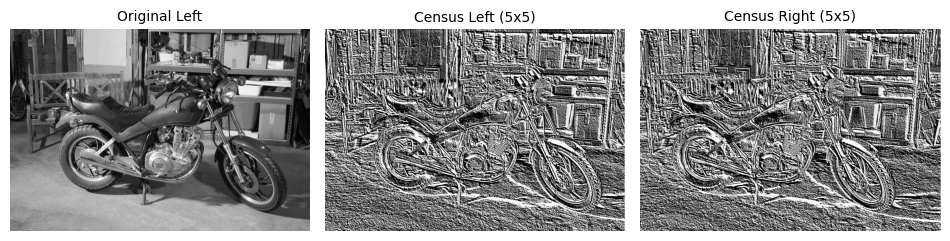

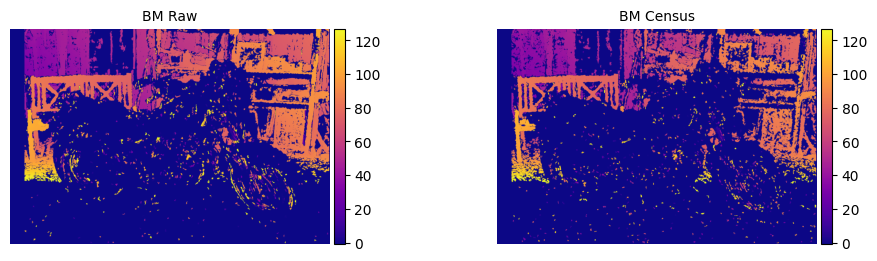

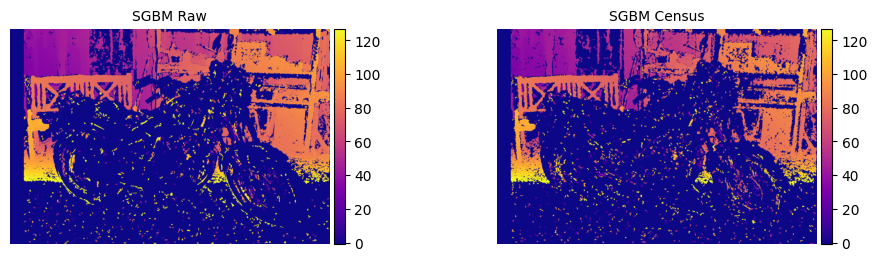

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

# ==========================================================
# 1️⃣ Load stereo images (NO GT REQUIRED)
# ==========================================================
left_path = "SampleData/WIDE_BASELINE_STEREO/CHECKERBOARD/rectified_LEFT_+2.bmp"
right_path = "SampleData/WIDE_BASELINE_STEREO/CHECKERBOARD/rectified_RIGHT_+2.bmp"

left_path = "SampleData/WIDE_BASELINE_STEREO/WHEEL/RECT_INP_LEFT_THETA_1.jpg"
right_path = "SampleData/WIDE_BASELINE_STEREO/WHEEL/RECT_INP_RIGHT_THETA_1.jpg"

left_path = "SampleData/bike_left.png"
right_path = "SampleData/bike_right.png"

# left_path = "SampleData/resample/ROT_BOT_-2l_right.jpg"
# right_path = "SampleData/resample/ROT_BOT_-2l_right.jpg"

# left_path = "SampleData/WIDE_BASELINE_STEREO/WHEEL/RECT_INP_LEFT_THETA_1.jpg"
# right_path = "SampleData/WIDE_BASELINE_STEREO/WHEEL/RECT_INP_RIGHT_THETA_1.jpg"
# left_path = "test_img1_L.jpg"
# right_path = "test_img1_R.jpg"

imgL = cv.imread(left_path, cv.IMREAD_GRAYSCALE)
imgR = cv.imread(right_path, cv.IMREAD_GRAYSCALE)

if imgL is None or imgR is None:
    raise FileNotFoundError("Images not found!")

print("Loaded:", imgL.shape, imgR.shape)


# ==========================================================
# 2️⃣ Census Transform (5×5 window)
# ==========================================================
def census_transform(img, ksize=11):
    h, w = img.shape
    r = ksize // 2
    census = np.zeros((h, w), dtype=np.uint32)

    for dy in range(-r, r+1):
        for dx in range(-r, r+1):
            if dy == 0 and dx == 0:
                continue

            shifted = np.zeros_like(img)
            shifted[max(0,dy):h-max(0,-dy), max(0,dx):w-max(0,-dx)] = \
                img[max(0,-dy):h-max(0,dy), max(0,-dx):w-max(0,dx)]

            census = (census << 1) | (shifted < img)

    return census


print("Applying Census Transform...")
censusL = census_transform(imgL, ksize=11)
censusR = census_transform(imgR, ksize=11)

# BM/SGBM require uint8 normalized input
censusL_norm = cv.normalize(censusL.astype(np.float32), None, 0, 255, cv.NORM_MINMAX).astype(np.uint8)
censusR_norm = cv.normalize(censusR.astype(np.float32), None, 0, 255, cv.NORM_MINMAX).astype(np.uint8)


# ==========================================================
# 3️⃣ StereoSGBM (RAW + CENSUS)
# ==========================================================
def compute_sgbm(L, R):
    stereo = cv.StereoSGBM_create(
        minDisparity=0,
        numDisparities=128,
        blockSize=15,
        uniquenessRatio=10,
        speckleWindowSize=100,
        speckleRange=16,
        preFilterCap=31,
        mode=cv.STEREO_SGBM_MODE_SGBM_3WAY
    )
    return stereo.compute(L, R).astype(np.float32) / 16.0


# ==========================================================
# 4️⃣ StereoBM (RAW + CENSUS)
# ==========================================================
def compute_bm(L, R):
    stereo = cv.StereoBM_create(
        numDisparities=128,
        blockSize=15
    )
    stereo.setPreFilterSize(9)
    stereo.setPreFilterCap(31)
    stereo.setMinDisparity(0)
    stereo.setTextureThreshold(20)
    stereo.setUniquenessRatio(10)
    stereo.setSpeckleWindowSize(100)
    stereo.setSpeckleRange(16)

    return stereo.compute(L, R).astype(np.float32) / 16.0


# ==========================================================
# 5️⃣ Compute Disparities: RAW vs CENSUS
# ==========================================================
disp_sgbm_raw    = compute_sgbm(imgL, imgR)
disp_sgbm_census = compute_sgbm(censusL_norm, censusR_norm)

disp_bm_raw      = compute_bm(imgL, imgR)
disp_bm_census   = compute_bm(censusL_norm, censusR_norm)


# ==========================================================
# 6️⃣ Compact Visualizations (RAW vs CENSUS)
# ==========================================================
os.makedirs("ShallowResultsX", exist_ok=True)


# ---------- FIGURE 1: Inputs ----------
fig, axes = plt.subplots(1, 3, figsize=(12, 2.8))
for ax in axes: ax.axis("off")

axes[0].imshow(imgL, cmap="gray")
axes[0].set_title("Original Left", fontsize=10)

axes[1].imshow(censusL_norm, cmap="gray")
axes[1].set_title("Census Left (5x5)", fontsize=10)

axes[2].imshow(censusR_norm, cmap="gray")
axes[2].set_title("Census Right (5x5)", fontsize=10)

plt.subplots_adjust(wspace=0.05)
plt.savefig("ShallowResultsX/fig_inputs.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()


# ---------- FIGURE 2: BM Disparity (RAW + CENSUS) ----------
fig, axes = plt.subplots(1, 2, figsize=(12, 2.8))
bm_maps = [disp_bm_raw, disp_bm_census]
bm_titles = ["BM Raw", "BM Census"]

for i, ax in enumerate(axes):
    im = ax.imshow(bm_maps[i], cmap="plasma")
    ax.set_title(bm_titles[i], fontsize=10)
    ax.axis("off")
    fig.colorbar(im, ax=ax, pad=0.01, fraction=0.03)

plt.subplots_adjust(wspace=0.1)
plt.savefig("ShallowResultsX/fig_bm_disparities.png", dpi=300, bbox_inches='tight', pad_inches=0.05)
plt.show()


# ---------- FIGURE 3: SGBM Disparity (RAW + CENSUS) ----------
fig, axes = plt.subplots(1, 2, figsize=(12, 2.8))
sgbm_maps = [disp_sgbm_raw, disp_sgbm_census]
sgbm_titles = ["SGBM Raw", "SGBM Census"]

for i, ax in enumerate(axes):
    im = ax.imshow(sgbm_maps[i], cmap="plasma")
    ax.set_title(sgbm_titles[i], fontsize=10)
    ax.axis("off")
    fig.colorbar(im, ax=ax, pad=0.01, fraction=0.03)

plt.subplots_adjust(wspace=0.1)


plt.show()


## Different Views

Loaded: (694, 1069) (775, 1043)
Good matches: 258
Inliers after RANSAC: 219


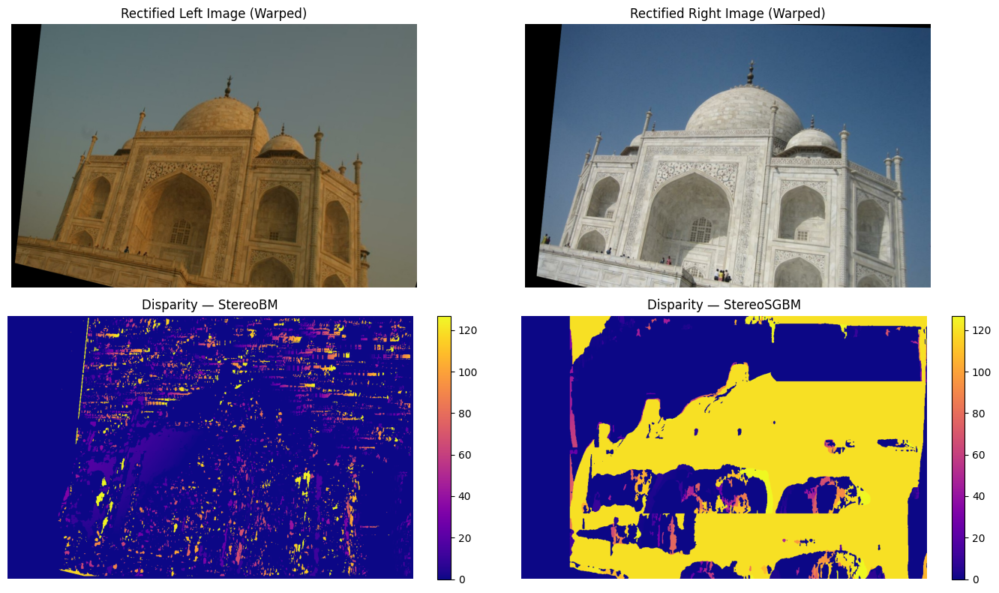

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# ==========================================================
# 1) Load your two Taj Mahal images
# ==========================================================
img1_path = "SampleData/33630978_4479213791.jpg"   # first image
img2_path = "SampleData/35493255_1223119156.jpg"   # second image

img1_color = cv.imread(img1_path)
img2_color = cv.imread(img2_path)

img1 = cv.cvtColor(img1_color, cv.COLOR_BGR2GRAY)
img2 = cv.cvtColor(img2_color, cv.COLOR_BGR2GRAY)

print("Loaded:", img1.shape, img2.shape)

# ==========================================================
# 2) Detect and match features (SIFT preferred)
# ==========================================================
try:
    sift = cv.SIFT_create()
except:
    sift = cv.ORB_create(5000)
    print("SIFT unavailable → using ORB")

kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

bf = cv.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

good = []
pts1 = []
pts2 = []

for m, n in matches:
    if m.distance < 0.8 * n.distance:
        good.append(m)
        pts1.append(kp1[m.queryIdx].pt)
        pts2.append(kp2[m.trainIdx].pt)

pts1 = np.float32(pts1)
pts2 = np.float32(pts2)

print("Good matches:", len(good))

# ==========================================================
# 3) Estimate Fundamental Matrix
# ==========================================================
F, mask = cv.findFundamentalMat(pts1, pts2, cv.FM_RANSAC)

# Keep only inliers
pts1 = pts1[mask.ravel() == 1]
pts2 = pts2[mask.ravel() == 1]

print("Inliers after RANSAC:", pts1.shape[0])

# ==========================================================
# 4) Compute Uncalibrated Rectification Homographies
# ==========================================================
h, w = img1.shape

retval, H1, H2 = cv.stereoRectifyUncalibrated(pts1, pts2, F, imgSize=(w, h))

if not retval:
    raise RuntimeError("❌ stereoRectifyUncalibrated failed — images too different.")

# ==========================================================
# 5) Warp images using homographies
# ==========================================================
rect1 = cv.warpPerspective(img1_color, H1, (w, h))
rect2 = cv.warpPerspective(img2_color, H2, (w, h))


# Convert to grayscale for stereo
rect1_gray = cv.cvtColor(rect1, cv.COLOR_BGR2GRAY)
rect2_gray = cv.cvtColor(rect2, cv.COLOR_BGR2GRAY)

# ==========================================================
# 6) StereoBM and StereoSGBM on rectified pair
# ==========================================================
sbm = cv.StereoBM_create(numDisparities=128, blockSize=15)
disp_bm = sbm.compute(rect1_gray, rect2_gray).astype(np.float32) / 16.0

sgbm = cv.StereoSGBM_create(
    minDisparity=0,
    numDisparities=128,
    blockSize=45,
    uniquenessRatio=10,
    speckleWindowSize=50,
    speckleRange=16,
    preFilterCap=31,
    mode=cv.STEREO_SGBM_MODE_SGBM_3WAY
)
disp_sgbm = sgbm.compute(rect1_gray, rect2_gray).astype(np.float32) / 16.0

# Mask invalid disparities
disp_bm[disp_bm < 0] = 0
disp_sgbm[disp_sgbm < 0] = 0

# ==========================================================
# 7) Display results
# ==========================================================
fig, axes = plt.subplots(2, 2, figsize=(14, 8))

axes[0, 0].imshow(rect1[:, :, ::-1])
axes[0, 0].set_title("Rectified Left Image (Warped)")
axes[0, 0].axis("off")

axes[0, 1].imshow(rect2[:, :, ::-1])
axes[0, 1].set_title("Rectified Right Image (Warped)")
axes[0, 1].axis("off")

im1 = axes[1, 0].imshow(disp_bm, cmap='plasma')
axes[1, 0].set_title("Disparity — StereoBM")
axes[1, 0].axis("off")
fig.colorbar(im1, ax=axes[1, 0], fraction=0.046)

im2 = axes[1, 1].imshow(disp_sgbm, cmap='plasma')
axes[1, 1].set_title("Disparity — StereoSGBM")
axes[1, 1].axis("off")
fig.colorbar(im2, ax=axes[1, 1], fraction=0.046)

plt.tight_layout()
plt.show()
